### Visualising the DC2 only population and overlaying published DC2 subclusters
### Using bbknn for batch correction instead of harmony as harmony was distorting the DC2 alone data

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce
from matplotlib.pyplot import rc_context
import seaborn as sns

In [ ]:
#set current directory 
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects'

In [3]:
data_DC2 = sc.read_h5ad('20250629_DC2_bbknn_clustered2.h5ad') 

In [4]:
#set current directory 
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects/Figures_Updated_20250703')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects/Figures_Updated_20250703'

## I need to re-do previous analysis (2025-05-05_DC2-clusters-overlay.jpynb) and instead of just re-doing clustering I need to subset out DC2 first and then re-do on raw object from hvg onwards:

``` bash
rsync -azvhp /QRISdata/Q5935/nikita/scdata/Python_Objects_Backup_20250105/Python_Integration_Sep/NR_cleandata.h5ad /scratch/user/s4436039/scdata/Myeloid_Objects/ 

In [4]:
# read in data
data_labels = sc.read_h5ad('NRclean_clustered2_DC.h5ad')
data_clean_prehvg = sc.read_h5ad('NR_cleandata.h5ad')

In [5]:
data_labels

AnnData object with n_obs × n_vars = 30241 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotatio

In [6]:
data_clean_prehvg

AnnData object with n_obs × n_vars = 498382 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'

In [7]:
#subset data_clean_prehvg to only the cells in data_labels based on barcode

# Get the list of barcodes (cell names) in data_labels
barcodes_to_keep = data_labels.obs.index

# subset data_clean_prehvg to just those in data_labels
data_clean_prehvg2 = data_clean_prehvg[data_clean_prehvg.obs.index.isin(barcodes_to_keep), :]

data_clean_prehvg2

View of AnnData object with n_obs × n_vars = 30241 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'

In [8]:
# transfer metadata from final atlas (data_labels) to clean data pre-hvg (want pre-hvg data so I can re-do hvg calculation on just DC2)

#define columns to transfer
meta_columns = ['Technology','NR_annotations_simple','sample_type_major2','cancer_with_H','cancer_broadest','patient_treatment']

# Subset the metadata in data_labels to match data_clean_prehvg2's barcodes
metadata_to_transfer = data_labels.obs.loc[data_clean_prehvg2.obs.index, meta_columns]

# Add these columns to data_clean_prehvg2's obs
for col in meta_columns:
    data_clean_prehvg2.obs[col] = metadata_to_transfer[col]

# Verify that the metadata was transferred
data_clean_prehvg2.obs.tail()

/scratch/temp/14461670/ipykernel_1715839/846974978.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,site,sample_type_major,cancer_subtype,...,leiden_DC,leiden_DC_v2,exclude_annots,leiden_M,Technology,NR_annotations_simple,sample_type_major2,cancer_with_H,cancer_broadest,patient_treatment
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_GTTTACTCAAGGCCTC,-9.995153,-8.131683,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2694.0,ovary,primary tumour,HGSOC,...,4,1,NA,NaN,10x3',cDC1,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TACCGAACAAACCGGA,-9.134331,-8.627023,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,839.0,ovary,primary tumour,HGSOC,...,2,4,NA,NaN,10x3',cDC2,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TCACGCTTCCGTCACT,-10.033317,-7.518040,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1683.0,ovary,primary tumour,HGSOC,...,3,2,NA,NaN,10x3',mregDC,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TGCAGTAGTGTTGCCG,-9.364501,-8.566583,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2257.0,ovary,primary tumour,HGSOC,...,5,15,NA,NaN,10x3',cDC2,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TGTGAGTTCGGAAACG,-9.738727,-7.459797,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,949.0,ovary,primary tumour,HGSOC,...,3,2,NA,NaN,10x3',mregDC,primary tumour,HGSOC,HGSOC,Treatment naive


In [9]:
data_labels.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2      17391
cDC1       6730
mregDC     6120
Name: count, dtype: int64

In [10]:
# check
data_clean_prehvg2.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2      17391
cDC1       6730
mregDC     6120
Name: count, dtype: int64

In [11]:
# subset to just cDC2
data_DC2 = data_clean_prehvg2[data_clean_prehvg2.obs["NR_annotations_simple"] == "cDC2"]

In [12]:
# check
data_DC2.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2    17391
Name: count, dtype: int64

# Filtering:

In [13]:
# remove any samples with less than 10 cells
data_DC2 = data_DC2[data_DC2.obs['integration_id'].map(data_DC2.obs['integration_id'].value_counts()) >= 10].copy()

In [14]:
# remove any genes expressed in less than 10 cells
sc.pp.filter_genes(data_DC2, min_cells=10)

# pre-hvg to integration on new DC2 only object:

In [15]:
data_DC2

AnnData object with n_obs × n_vars = 16643 × 14070
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'log1p'

In [16]:
# identify highly variable genes
sc.pp.highly_variable_genes(data_DC2, min_mean=0.0125, max_mean=3, min_disp=0.5)
data_DC2

AnnData object with n_obs × n_vars = 16643 × 14070
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [17]:
#set hidden slot
data_DC2.raw = data_DC2

In [18]:
#to get number of HV genes
print(data_DC2.var.highly_variable.sum())

2001


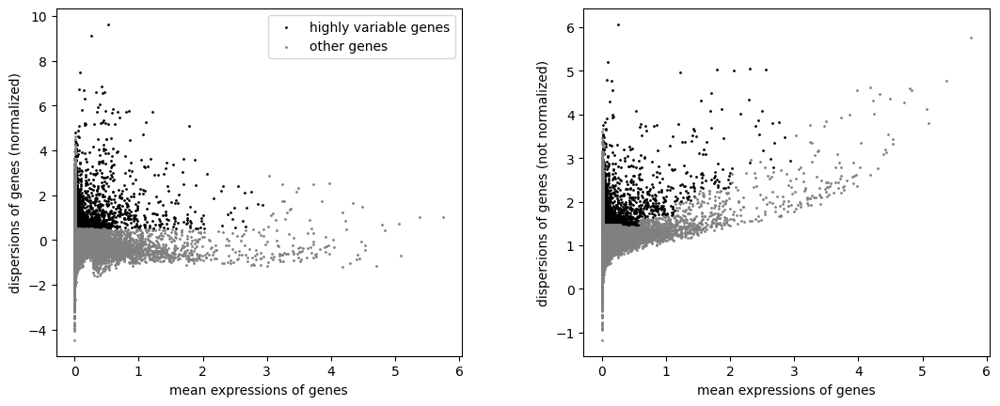

In [19]:
#plot out the number of highly variable genes
sc.pl.highly_variable_genes(data_DC2)

### regress out factors and perform scaling

In [20]:
# Actually do the filtering for PCA
data_DC2 = data_DC2[
    :, data_DC2.var.highly_variable
].copy()  # all rows/indexes : columns only selecting for those within high_variable, and then making a copy of itself
data_DC2

AnnData object with n_obs × n_vars = 16643 × 2001
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [21]:
#Regress out total counts, %mt, cycling genes (30sec)
sc.pp.regress_out(data_DC2, ["total_counts", "pct_counts_mt", 'S_score', 'G2M_score'])
sc.pp.scale(data_DC2, max_value=10)

In [22]:
data_DC2

AnnData object with n_obs × n_vars = 16643 × 2001
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'l

### Perform PCA:

In [23]:
## perform PCA, adjust number of PCs to calculate. (1mins)
sc.pp.pca(data_DC2, n_comps=50)

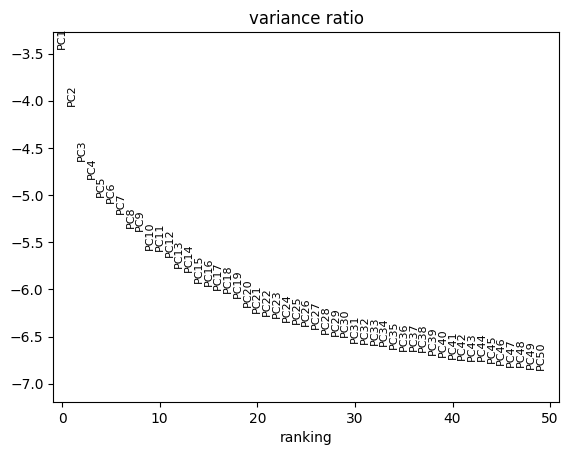

In [24]:
# make elbow plot to see variance contribution by each pc, choose inflection point
sc.pl.pca_variance_ratio(data_DC2, log=True, n_pcs=50)

### BBKNN Integration: 
* using bbknn for batch correction instead of Harmony, as for the DC2 object (perhaps due to the lower cell counts per sample) harmony was distorting the data significantly 

In [25]:
sce.pp.bbknn(data_DC2, batch_key='integration_id')  

In [26]:
data_DC2.obsm

AxisArrays with keys: X_pca

#### No longer need neighbors step (bbknn replaces this)

### UMAP:

In [27]:
sc.tl.umap(data_DC2, min_dist=0.3) 

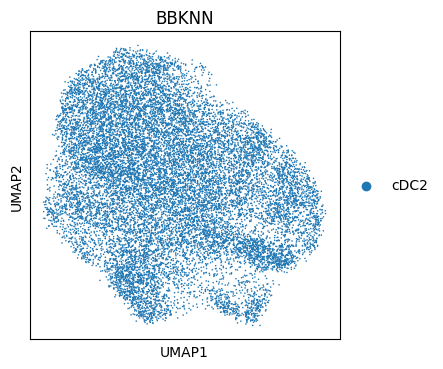

In [28]:
#plotting DC2 map
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data_DC2, color=["NR_annotations_simple"], ncols=1, size=5, title='BBKNN')

# Visualisation/Clustering:

## Overlay published gene sets:

In [5]:
#define DC subset gene sets from Guimaraes et al and Cheng et al
DC2_FCER1A = ['CD1C', 'FCER1A', 'CLEC10A']
DC2_AREG = ['AREG']
DC2_CD207 = ['CD207','CD1A'] #similar to DC2_CD1A in Cheng et al
DC3_CD14 = ['CD14', 'S100A9', 'S100A8', 'VCAN', 'LYZ','ANXA1']
DC4_FCGR3A = ['FCGR3A', 'FTL', 'SERPINA1']
DC_CXCL8 = ['CXCL2'] #CXCL8 removed as not in atlas 

DC2_CXCR4 = ['CXCR4','DUSP4','FCER1A']
DC2_CD1A = ['CD207','CD1A','S100B','LTB'] 
DC2_IL1B = ['IL1B','TNF','CCL3','CCL4']
DC2_FCN1 = ['CD163', 'CD14', 'FCN1','S100A9','S100A8']
DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
DC2_CXCL9 = ['CXCL9','CXCL10','IDO1']

In [6]:
gene_sets_all = {
    "Guimaraes_DC2_FCER1A": DC2_FCER1A,
    "Guimaraes_DC2_AREG": DC2_AREG,
    "Guimaraes_DC2_CD207": DC2_CD207,
    "Guimaraes_DC3_CD14": DC3_CD14,
    "Guimaraes_DC4_FCGR3A": DC4_FCGR3A,
    "Guimaraes_DC_CXCL2": DC_CXCL8,
    "Cheng_DC2_CXCR4": DC2_CXCR4,
    "Cheng_DC2_CD1A": DC2_CD1A,
    "Cheng_DC2_IL1B": DC2_IL1B,
    "Cheng_DC2_FCN1": DC2_FCN1,
    "Cheng_DC2_ISG15": DC2_ISG15,
    "Cheng_DC2_CXCL9": DC2_CXCL9
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets_all.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [8]:
colour_vars = ["Guimaraes_DC2_FCER1A","Guimaraes_DC2_AREG","Guimaraes_DC2_CD207","Guimaraes_DC3_CD14","Guimaraes_DC4_FCGR3A","Guimaraes_DC_CXCL2","Cheng_DC2_CXCR4","Cheng_DC2_CD1A","Cheng_DC2_IL1B","Cheng_DC2_FCN1","Cheng_DC2_ISG15","Cheng_DC2_CXCL9"]

In [9]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

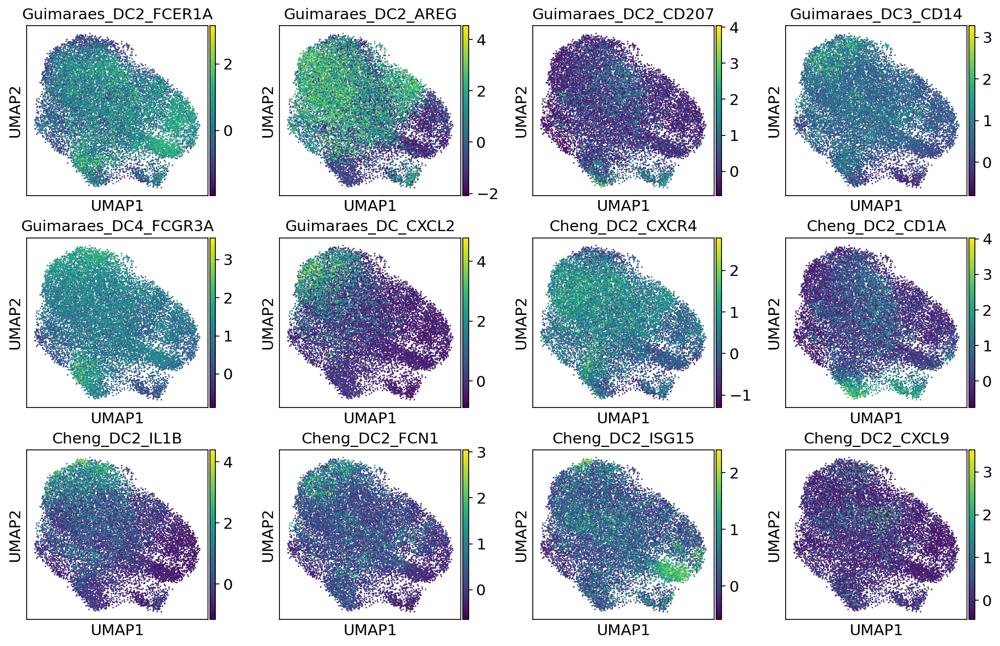

In [10]:
# plot:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=4, size=8, 
    save="_DC2_sigs_overlay_updated2.svg")

In [ ]:
# export object (after update): 
#data_DC2.write_h5ad("20250613_DC2_bbknn.h5ad", compression="gzip")

## CLustering DC2 (40min):

In [41]:
# Update after updated parameters 
sc.tl.leiden(data_DC2, resolution=0.2, key_added='2025-DC2-true_02')
sc.tl.leiden(data_DC2, resolution=0.5, key_added='2025-DC2-true_05')
sc.tl.leiden(data_DC2, resolution=0.8, key_added='2025-DC2-true_08')

/scratch/temp/14461670/ipykernel_1715839/3641059270.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [61]:
data_DC2.write_h5ad("20250613_DC2_bbknn_clustered.h5ad", compression="gzip")

In [42]:
colour_vars = ['2025-DC2-true_02', '2025-DC2-true_05', '2025-DC2-true_08']

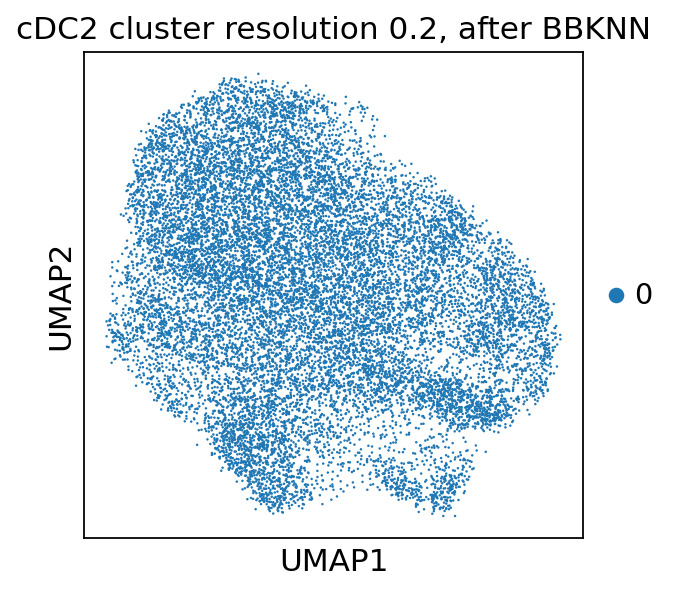

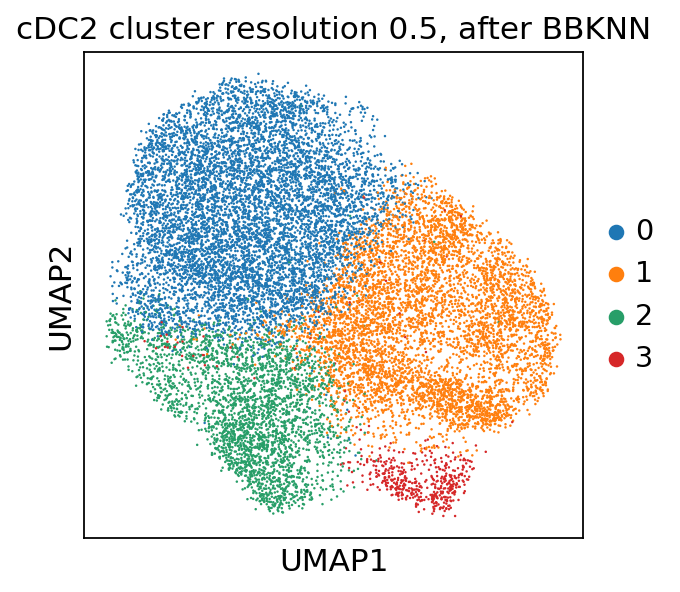

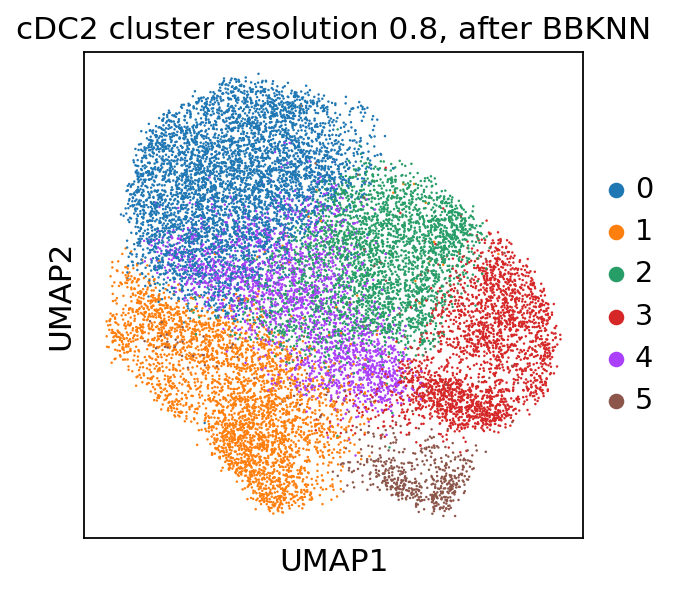

In [43]:
#plotting clusters 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_02"], ncols = 1, size=5, title="cDC2 cluster resolution 0.2, after BBKNN")
    sc.pl.umap(data_DC2, color=["2025-DC2-true_05"], ncols = 1, size=5, title="cDC2 cluster resolution 0.5, after BBKNN")
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08"], ncols = 1, size=5, title="cDC2 cluster resolution 0.8, after BBKNN")

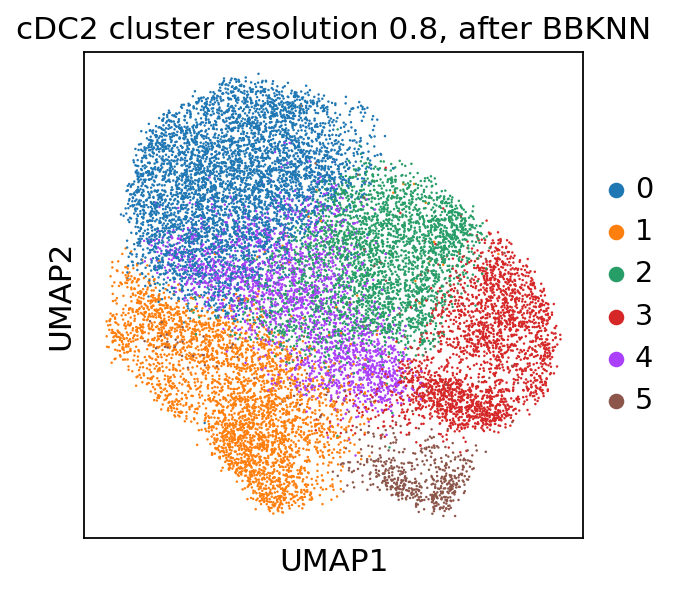

In [45]:
#plotting clusters 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08"], ncols = 1, size=5, title="cDC2 cluster resolution 0.8, after BBKNN", save="_DC2_subcluster.svg")

In [46]:
#output the number of cells in each cluster
data_DC2.obs["2025-DC2-true_08"].value_counts()

2025-DC2-true_08
0    4914
1    3284
2    3078
3    2400
4    2345
5     622
Name: count, dtype: int64

In [ ]:
# #define DC subset gene sets from Guimaraes et al and Cheng et al
# DC2_FCER1A = ['CD1C', 'FCER1A', 'CLEC10A']
# DC2_AREG = ['AREG']
# # removed DC2_CD207 = ['CD207','CD1A'] as within Cheng et al DC2_CD1A
# DC3_CD14 = ['CD14', 'S100A9', 'S100A8', 'VCAN', 'LYZ','ANXA1']
# DC4_FCGR3A = ['FCGR3A', 'FTL', 'SERPINA1']
# DC_CXCL8 = ['CXCL2'] #CXCL8 removed as not in atlas 

# DC2_CXCR4 = ['CXCR4','DUSP4','FCER1A']
# DC2_CD1A = ['CD207','CD1A','S100B','LTB'] # also Guimaraes DC2_CD207
# DC2_IL1B = ['IL1B','TNF','CCL3','CCL4']
# DC2_FCN1 = ['CD163', 'CD14', 'FCN1','S100A9','S100A8']
# DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
# DC2_CXCL9 = ['CXCL9','CXCL10','IDO1']

In [ ]:
# gene_sets_all = {
#     "Guimaraes_DC2_FCER1A": DC2_FCER1A,
#     "Guimaraes_DC2_AREG": DC2_AREG,
#     "Guimaraes_DC3_CD14": DC3_CD14,
#     "Guimaraes_DC4_FCGR3A": DC4_FCGR3A,
#     "Guimaraes_DC_CXCL2": DC_CXCL8,
#     "Cheng_DC2_CXCR4": DC2_CXCR4,
#     "Cheng_Guimaraes_DC2_CD1A/CD207": DC2_CD1A,
#     "Cheng_DC2_IL1B": DC2_IL1B,
#     "Cheng_DC2_FCN1": DC2_FCN1,
#     "Cheng_DC2_ISG15": DC2_ISG15,
#     "Cheng_DC2_CXCL9": DC2_CXCL9
# }

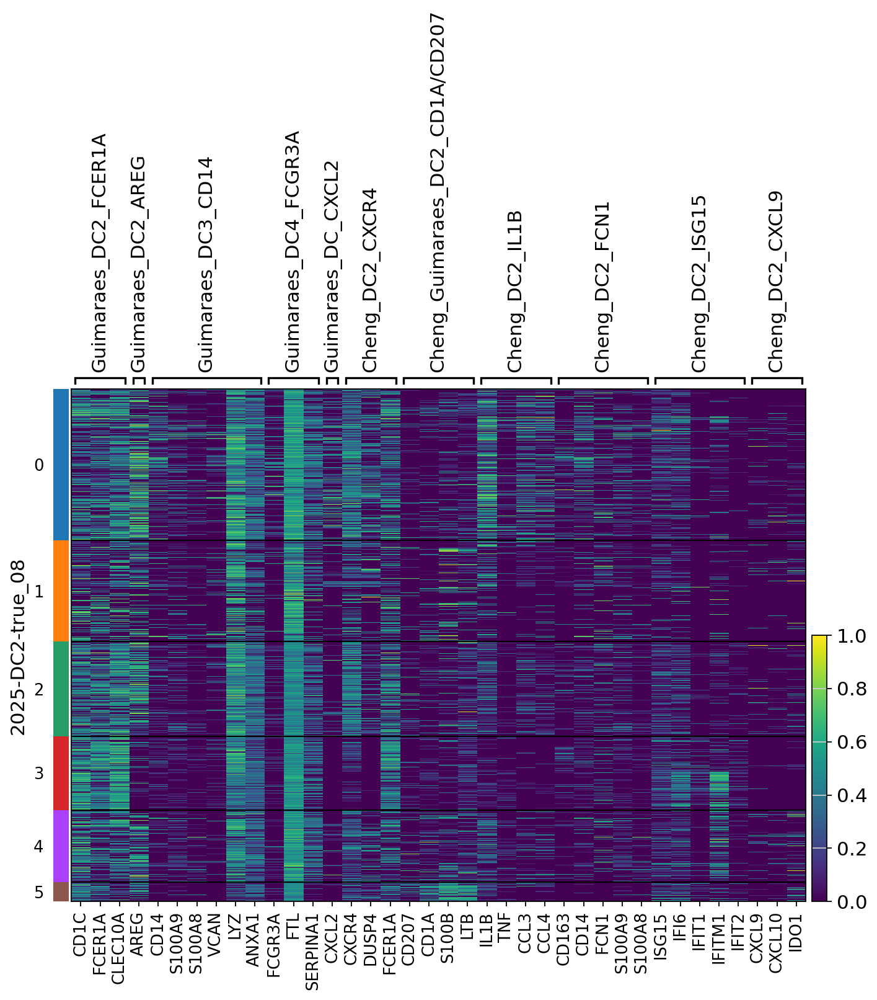

In [ ]:
### Re-done with updated clusters below

#sc.pl.heatmap(data_DC2, gene_sets_all, groupby="2025-DC2-true_08", standard_scale="var", figsize=(10,7), save="_DC2_subcluster_sigs_updated.svg") 

## Breakdown of clusters:

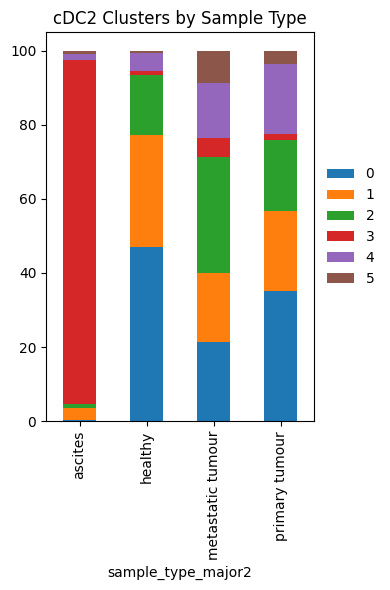

In [4]:
pd.crosstab(data_DC2.obs["sample_type_major2"], data_DC2.obs["2025-DC2-true_08"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(4,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("cDC2 Clusters by Sample Type")
plt.tight_layout()  
plt.savefig("barplot_clusters-tissues.svg", format="svg", bbox_inches="tight")
plt.show()

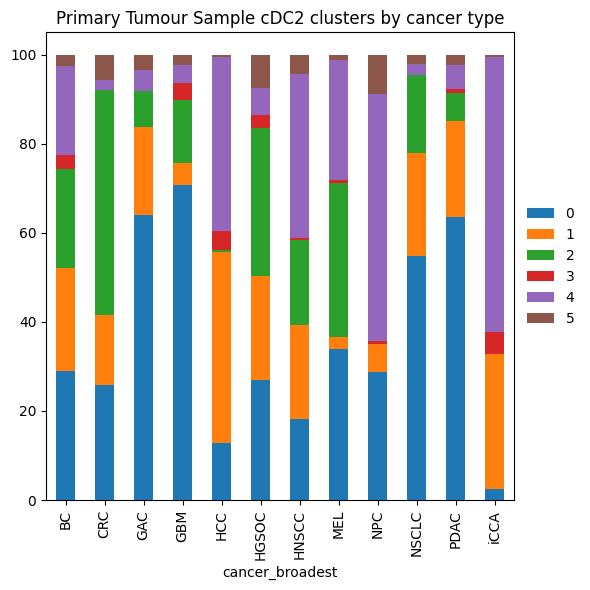

In [7]:
# subset to just primary
data_DC2_P = data_DC2[data_DC2.obs["sample_type_major2"] == "primary tumour"]

pd.crosstab(data_DC2_P.obs["cancer_broadest"], data_DC2_P.obs["2025-DC2-true_08"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("Primary Tumour Sample cDC2 clusters by cancer type")
plt.tight_layout()  
plt.savefig("barplot_clusters-cancers.svg", format="svg", bbox_inches="tight")
plt.show()

### Checking Villani et al. 2017 sigs

In [ ]:
# Read in data
#data_DC2 = sc.read_h5ad('20250613_DC2_bbknn_clustered.h5ad')

In [8]:
#define DC subset gene sets from Villani et al 2017
DC2_sig = ['CD1C','FCER1A','CLEC10A','ADAM8','CD1D','FCGR2B','CLEC4A','SLC2A3','CD33','ETS2','CLIC2','PEA15','CACNA2D3','CD1E','MBOAT7','C10ORF128','NR4A2','AGPAT9','ENTPD1','CD2','PER1','PID1','AREG','PTGS1','SMA','CLEC17A','ITGA5','CREB5','PTAFR','NOD2','CCR6']
DC3_sig = ['S100A9','S100A8','VCAN','LYZ','ANXA1','PLBD1','RNASE2','FCER1A','SLC2A3','CD163','CSF3R','MNDA','CD14','NAIP','CSTA','FCN1','CD1D','FPR1','F13A1','CLEC10A','CES1','PID1','S100A12','MTMR11','SMA','LAT2','RETN','TMEM173','AOAH','RAB3D','CD36','MGST1','TREM1','HNMT','CES1P1','ADAM15','IL13RA1','MICAL2','ITGA5','CREB5','IL1B','NR4A2','MPP7','PTAFR','HBEGF','NFE2','ASGR1','BST1','IL1RN','NOD2','NLRP3','DQ575504','LMNA','C9ORF89','IL27RA','NLRP12','RAB27A','EREG','LOC284454']

In [9]:
# Define dictionary of gene sets
gene_sets = {
    "DC2_sig": DC2_sig,
    "DC3_sig": DC3_sig
}

In [10]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [26]:
colour_vars = ["DC2_sig","DC3_sig","2025-DC2-true_08"]

In [12]:
titles=['cDC2 Score (Villani et al. 2017)','DC3 Score (Villani et al. 2017)', 'Leiden Clusters (res 0.8)']

In [14]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

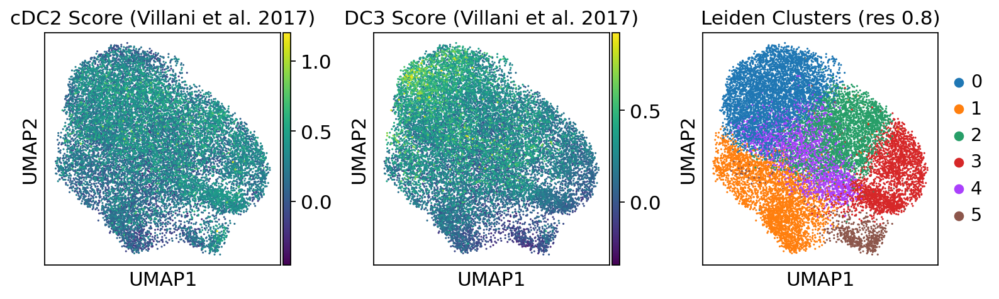

In [16]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=3, size=8, title=titles, save="_DC2_sigs_Villani_overlay.svg")

# Cluster 3 unique to ascites, calculating DEG genes to try and understand why

In [17]:
#calculate DEG genes:
sc.tl.rank_genes_groups(data_DC2, groupby="2025-DC2-true_08", method="wilcoxon")

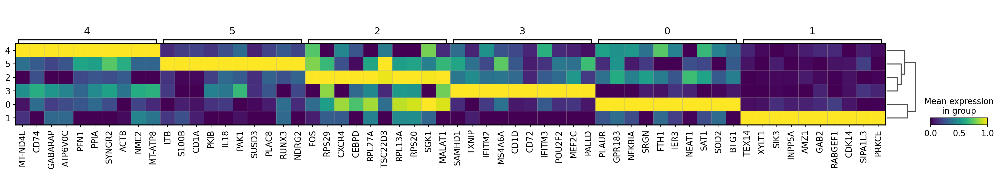

In [21]:
# visualise the top 10 DEG genes
sc.tl.dendrogram(data_DC2, groupby="2025-DC2-true_08")
sc.pl.rank_genes_groups_matrixplot(data_DC2, groupby="2025-DC2-true_08", standard_scale="var", n_genes=10, min_logfoldchange=1, save="_DC2_DEGs10.svg")

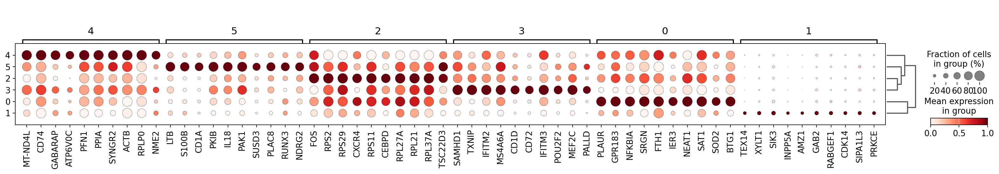

In [19]:
sc.pl.rank_genes_groups_dotplot(data_DC2, groupby="2025-DC2-true_08", standard_scale="var", n_genes=10)

In [20]:
# output top 10 DEGs from cluster 3
sc.get.rank_genes_groups_df(data_DC2, group="3").head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,SAMHD1,60.348186,2.250544,0.0,0.0
1,TXNIP,59.116295,3.023892,0.0,0.0
2,IFITM2,53.953659,2.293332,0.0,0.0
3,MS4A6A,48.864338,1.903880,0.0,0.0
4,CD1D,47.960514,2.425398,0.0,0.0
5,CD72,45.439877,2.565008,0.0,0.0
6,IFITM3,44.168076,2.133707,0.0,0.0
7,POU2F2,43.066631,2.214133,0.0,0.0
8,MEF2C,42.781437,1.688498,0.0,0.0
9,PALLD,42.274033,2.714449,0.0,0.0


# Overlaying signatures from Minutti ... Caetano et al. 2024:

In [5]:
#define DC subset gene sets from Villani et al 2017
cDC2A_sig = ['CLEC4A','LTB','IL22RA2','CD3E']
cDC2B_sig = ['CEBPD','IL1R2','FCER1A','FCN1','IL1B','CD1C','CEBPB','CLEC10A']
DC3_sig = ['S100A9','S100A8','VCAN','LYZ']

In [6]:
# Define dictionary of gene sets
gene_sets = {
    "cDC2A_sig": cDC2A_sig,
    "cDC2B_sig": cDC2B_sig,
    "DC3_sig": DC3_sig,
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [8]:
colour_vars = ["cDC2A_sig","cDC2B_sig","DC3_sig","2025-DC2-true_08"]

In [9]:
titles=['cDC2A Score (Minutti et al. 2024)','cDC2B Score (Minutti et al. 2024)','DC3 Score (Minutti et al. 2024)', 'Leiden Clusters (res 0.8)']

In [ ]:
#sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

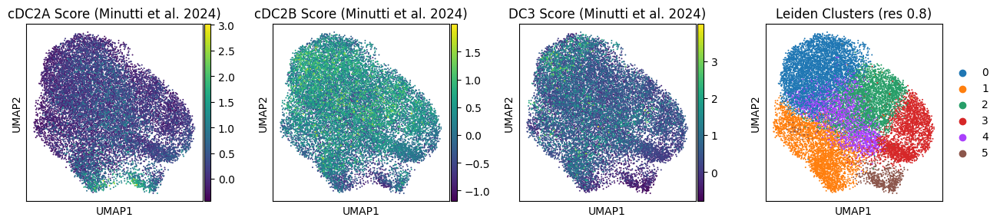

In [10]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=4, size=8, title=titles)

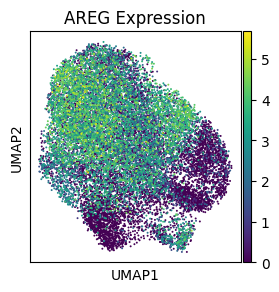

In [17]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["AREG"], ncols=1, size=8, title="AREG Expression")

# Long sigs:

In [4]:
#define DC subset gene sets from Villani et al 2017
cDC2A_sig = ['AL589693.1','DNTT','SPINK2','JCHAIN','FAM30A','CASC15','MME','IGHM','BAALC','SDK2','HOPX','VPREB1','CD79A','SMIM24','EBF1','IGLL1','TOX','LINC01374','MEIS1','NKAIN2','PCDH9','STRBP','LTB','RNF125','P2RY14','MSI2','RNF220','SOX4','PAM','ITM2C','BCL11A','TCF4','SNHG7','RPS26','VAV3','SSBP2','NUCB2','CDK6','AUTS2','ITGA4','DSTN','CD99','TXNIP','RUNX2','CD69','ZCCHC7','AFF1','AGPS','IGKC']
cDC2B_sig = ['FCER1A','CD1C','AREG','CRYBG1','CLEC10A','MAP3K8','SH3BP4','SGK1','RTN1','TOB1','JAML','TENM4','ENHO','RGS1','IGSF6','FCER1G','HLA-DMA','SLC38A1','C1orf162','NR4A3','ATP1B3','B2M','IFI30','GPR183','FTH1','GRASP','MYL12A','JUNB','OGFRL1','CD86','TNFAIP3','CEBPD','RGS2','AC087286.2','GADD45B','LGALS2','CCNH','CD52','MT2A','TEX14']
DC3_sig = ['PDE4D','FNDC3B','ZEB2','LYST','MBNL1','AZU1','ASPH','RBM47','S100A8','PLCB1','SLCO3A1','PCNX1','SLC22A15','IL1RAP','SYK','ATXN1','VCAN','ARHGAP26','AGFG1','GPCPD1','AGTPBP1','GNAQ','PRLR','RETN','MPO','SLC44A1','LRMDA','SIPA1L1','ADIPOR2','SLC39A11','VMP1','PTPN12','DIAPH2','S100A9','FRY','ZSWIM6','SLC11A1','ACSM3','ASAP1','ELANE','SGMS1','SNTB1','CTSG','DACH1','SLC2A3','ATP8B4','ZBTB16','PRTN3','ANPEP','S100A12']

In [5]:
# Define dictionary of gene sets
gene_sets = {
    "cDC2A_sig": cDC2A_sig,
    "cDC2B_sig": cDC2B_sig,
    "DC3_sig": DC3_sig,
}

In [6]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

       'LINC01374', 'SNHG7', 'IGKC'],
      dtype='object')


In [7]:
colour_vars = ["cDC2A_sig","cDC2B_sig","DC3_sig","2025-DC2-true_08"]

In [8]:
titles=['cDC2A Score Long (Minutti et al. 2024)','cDC2B Score Long (Minutti et al. 2024)','DC3 Score Long (Minutti et al. 2024)', 'Leiden Clusters (res 0.8)']

In [ ]:
#sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

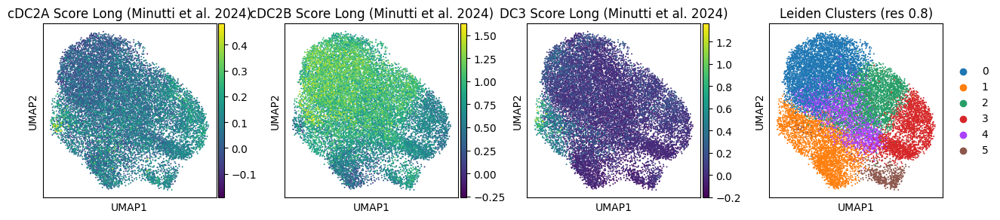

In [11]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=4, size=8, title=titles)

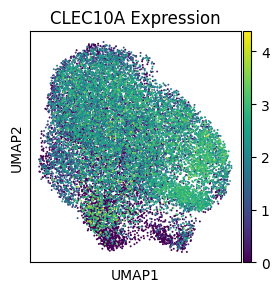

In [10]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["CLEC10A"], ncols=1, size=8, title="CLEC10A Expression")

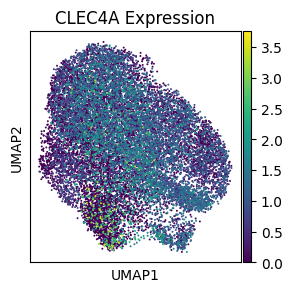

In [11]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["CLEC4A"], ncols=1, size=8, title="CLEC4A Expression")

# Clustering at higher res to identify cDC2A and cDC2B:

In [3]:
# Read in data
data_DC2 = sc.read_h5ad('20250613_DC2_bbknn_clustered.h5ad')

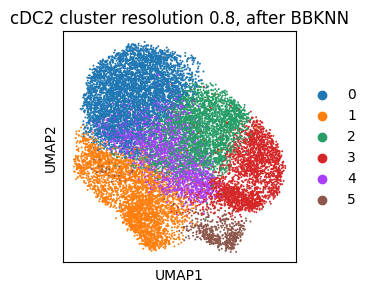

In [4]:
#plotting clusters 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08"], ncols = 1, size=8, title="cDC2 cluster resolution 0.8, after BBKNN")

In [ ]:
# cluster (30min)
sc.tl.leiden(data_DC2, resolution=1, key_added='2025-DC2-true_10')

/scratch/temp/14639494/ipykernel_4122675/3458282902.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


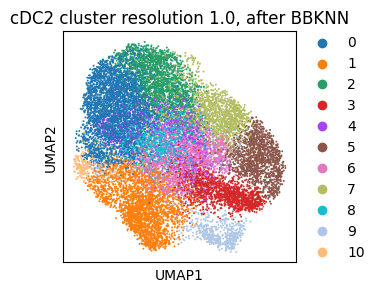

In [6]:
#plotting clusters 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_10"], ncols = 1, size=8, title="cDC2 cluster resolution 1.0, after BBKNN")

## use 0.8 res but subcluster clusters 0 and 5

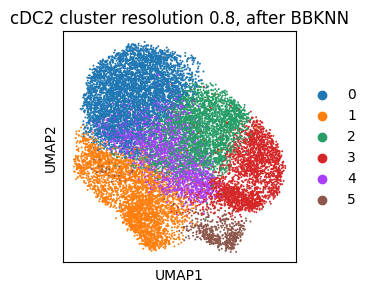

In [5]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08"], ncols = 1, size=8, title="cDC2 cluster resolution 0.8, after BBKNN")

In [6]:
# sub cluster cluster 5
sc.tl.leiden(data_DC2, restrict_to=('2025-DC2-true_08', ['5']), resolution=0.5, key_added="2025-DC2-true_08_sub5")

/scratch/temp/14643176/ipykernel_617991/3058096033.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


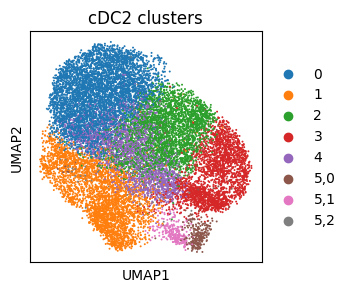

In [7]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08_sub5"], ncols = 1, size=8, title="cDC2 clusters")

In [8]:
# sub cluster cluster 1
sc.tl.leiden(data_DC2, restrict_to=('2025-DC2-true_08_sub5', ['1']), resolution=0.5, key_added="2025-DC2-true_08_sub5-1")

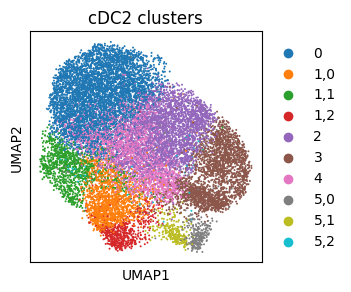

In [9]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08_sub5-1"], ncols = 1, size=8, title="cDC2 clusters")

In [ ]:
# sub cluster cluster 3
#sc.tl.leiden(data_DC2, restrict_to=('2025-DC2-true_08_sub5-1', ['3']), resolution=0.5, key_added="2025-DC2-true_high-res")

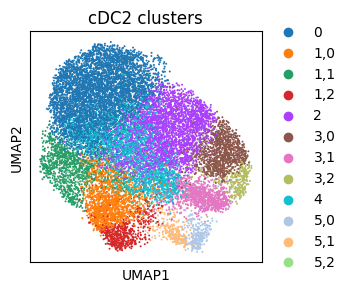

In [ ]:
#with plt.rc_context({"figure.figsize": (3, 3)}):
    #sc.pl.umap(data_DC2, color=["2025-DC2-true_high-res"], ncols = 1, size=8, title="cDC2 clusters")

In [12]:
#define DC subset gene sets from Villani et al 2017
cDC2A_sig = ['CLEC4A','LTB','IL22RA2','CD3E']
cDC2B_sig = ['CEBPD','IL1R2','FCER1A','FCN1','IL1B','CD1C','CEBPB','CLEC10A']

In [13]:
# Define dictionary of gene sets
gene_sets = {
    "cDC2A_sig": cDC2A_sig,
    "cDC2B_sig": cDC2B_sig,
}

In [14]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [15]:
colour_vars = ["cDC2A_sig","cDC2B_sig","2025-DC2-true_08_sub5-1"]

In [16]:
titles=['cDC2A Score (Minutti et al. 2024)','cDC2B Score (Minutti et al. 2024)', 'Leiden Clusters']

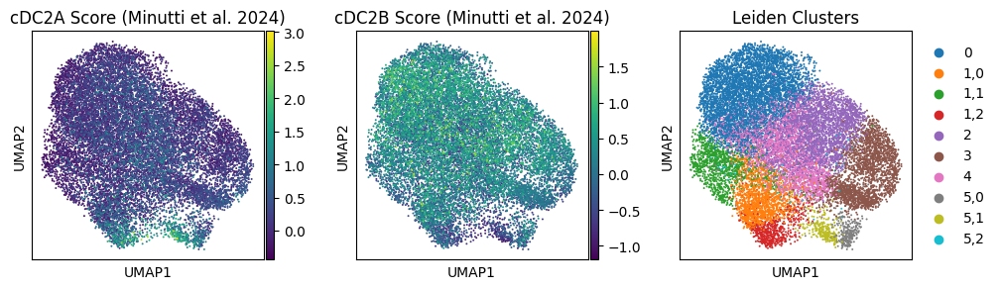

In [17]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=4, size=8, title=titles)

### From above: clusters 1,2 and 5,1 5,0 and 5,2 look like cDC2A, rest look like cDC2B

In [6]:
# check annots
annots = data_DC2.obs['2025-DC2-true_08_sub5-1'].value_counts()
print(annots)

2025-DC2-true_08_sub5-1
0      4914
2      3078
3      2400
4      2345
1,0    1538
1,1    1123
1,2     623
5,0     290
5,1     269
5,2      63
Name: count, dtype: int64


In [7]:
# Assign cDC2A/cDC2B labels:
data_DC2.obs["cDC2_A-B"] = data_DC2.obs["2025-DC2-true_08_sub5-1"].map(
    {
        "0": "cDC2B",
        "1,0": "cDC2B",
        "1,1": "cDC2B",
        "1,2": "cDC2A",
        "2": "cDC2B",
        "3": "cDC2B",
        "4": "cDC2B",
        "5,0": "cDC2A",
        "5,1": "cDC2A",
        "5,2": "cDC2A",
    }
)

In [8]:
data_DC2.uns["cDC2_A-B_colors"] = ["#800074", "#7e8fb0"]  

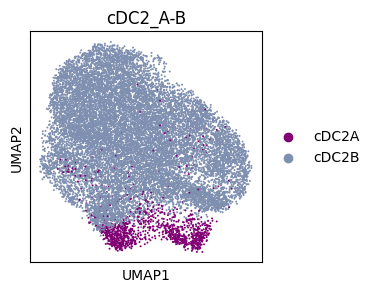

In [43]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["cDC2_A-B"], ncols=4, size=8)

In [20]:
colour_vars = ["cDC2A_sig","cDC2B_sig","cDC2_Atlas_Subclusters","cDC2_A-B"]

In [18]:
#set current directory 
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects/Figures_Updated_20250703')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects/Figures_Updated_20250703'

In [12]:
# Re-number clusters to simplify for fig

data_DC2.obs["cDC2_Atlas_Subclusters"] = data_DC2.obs["2025-DC2-true_08_sub5-1"].map(
    {
        "0": "1",
        "1,0": "2",
        "1,1": "3",
        "1,2": "4",
        "2": "5",
        "3": "6",
        "4": "7",
        "5,0": "8",
        "5,1": "9",
        "5,2": "10",
    }
)

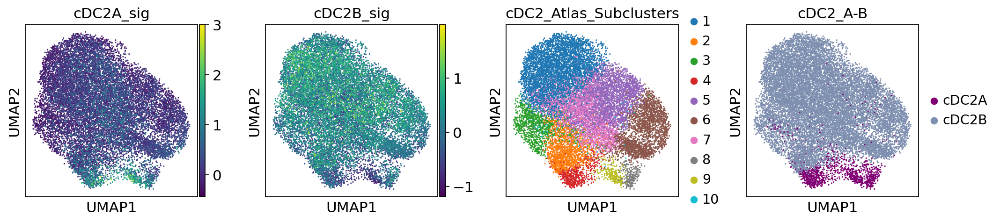

In [23]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=4, size=8, save="_cDC2_A-B_Overlays2.svg")

In [16]:
data_DC2

AnnData object with n_obs × n_vars = 16643 × 2001
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment', 'Guimaraes_DC2_FCER1A', 'Guimaraes_DC2_AREG', 'Guimaraes_Cheng_DC2_CD207/CD1A', 'Guimaraes_DC3_CD14', 'Guimaraes_DC4_FCGR3A', 'Guimaraes_DC_CXCL2', 'Cheng_DC2_CXCR4', 'Cheng_DC2_IL1B', 'Cheng_DC2_FCN1', 'Cheng_DC2_ISG15', 'Cheng_DC2_CXCL9', 

In [19]:
data_DC2.write_h5ad("20250629_DC2_bbknn_clustered2.h5ad", compression="gzip")

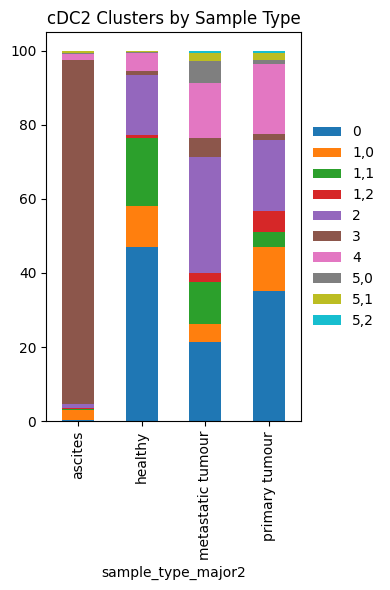

In [17]:
pd.crosstab(data_DC2.obs["sample_type_major2"], data_DC2.obs["2025-DC2-true_08_sub5-1"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(4,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("cDC2 Clusters by Sample Type")
plt.tight_layout()  
plt.show()

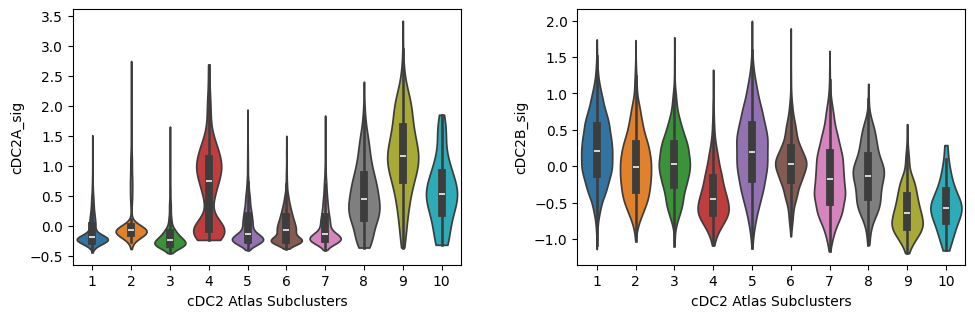

In [63]:
with plt.rc_context({"figure.figsize": (5, 3.5)}):
    sc.pl.violin(
        data_DC2,
        keys=list(gene_sets.keys()),  
        groupby='cDC2_Atlas_Subclusters',
        stripplot=False,
        inner='box',
        save="_DC2_clusters_Violins.svg"
    )

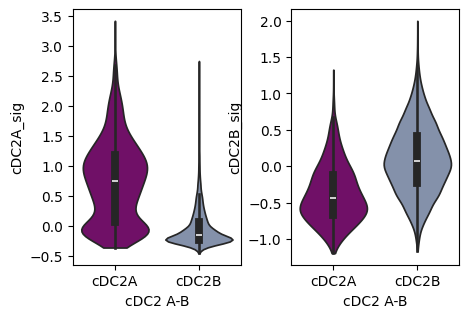

In [21]:
with plt.rc_context({"figure.figsize": (3, 3.5)}):
    sc.pl.violin(
        data_DC2,
        keys=list(gene_sets.keys()),  
        groupby='cDC2_A-B',
        stripplot=False,
        inner='box',
        multi_panel=True,
        save="_DC2_AB_Violins2.svg"  
    )

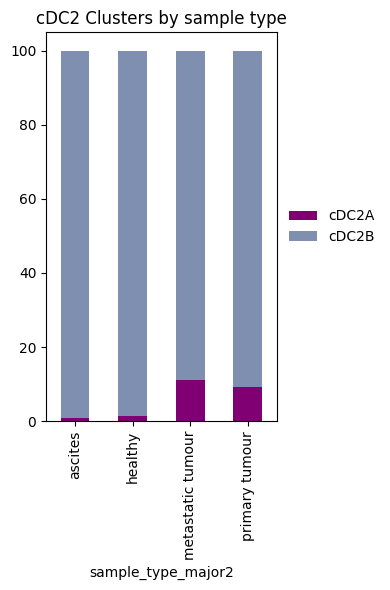

In [22]:
pd.crosstab(data_DC2.obs["sample_type_major2"], data_DC2.obs["cDC2_A-B"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(4,6), color=["#800074", "#7e8fb0"])
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("cDC2 Clusters by sample type")
plt.tight_layout()  
plt.savefig("barplot_DC2A-B_sampletype2.svg", format="svg", bbox_inches="tight")
plt.show()

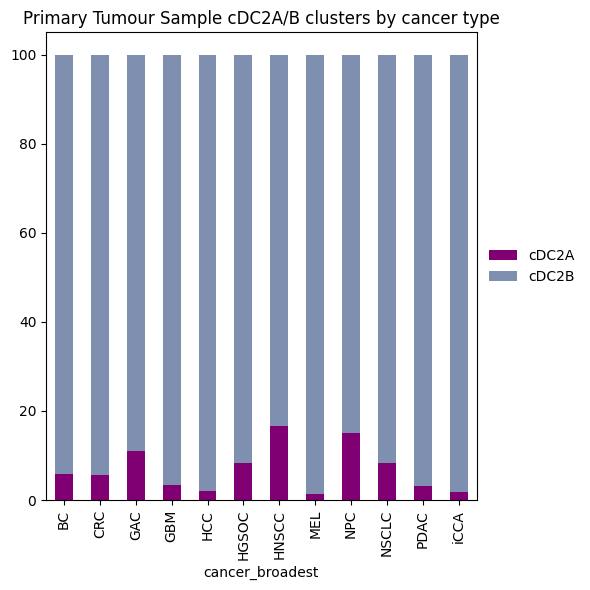

In [23]:
# subset to just primary
data_DC2_P = data_DC2[data_DC2.obs["sample_type_major2"] == "primary tumour"]

pd.crosstab(data_DC2_P.obs["cancer_broadest"], data_DC2_P.obs["cDC2_A-B"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6), color=["#800074", "#7e8fb0"])
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("Primary Tumour Sample cDC2A/B clusters by cancer type")
plt.tight_layout()  
plt.savefig("barplot_DC2A-B_cancers2.svg", format="svg", bbox_inches="tight")
plt.show()

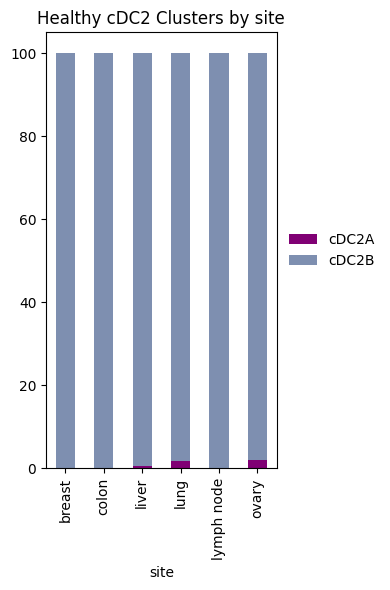

In [24]:
# subset out healthy:
data_DC2_H = data_DC2[data_DC2.obs["sample_type_major2"] == "healthy"]

pd.crosstab(data_DC2_H.obs["site"], data_DC2_H.obs["cDC2_A-B"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(4,6), color=["#800074", "#7e8fb0"])
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("Healthy cDC2 Clusters by site")
plt.tight_layout()  
plt.show()

# Calculating DEG genes between cDC2A and cDC2B:

In [4]:
# check annots
print(data_DC2.obs['cDC2_A-B'].value_counts())

cDC2_A-B
cDC2B    15398
cDC2A     1245
Name: count, dtype: int64


In [49]:
#calculate DEG genes between cDC2A and cDC2B:
sc.tl.rank_genes_groups(data_DC2, groupby="cDC2_A-B", method="wilcoxon", key_added="degs_cDC2A_vs_cDC2B")

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


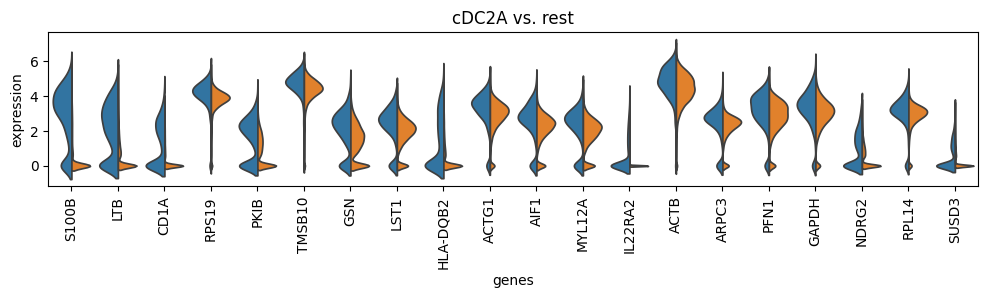

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


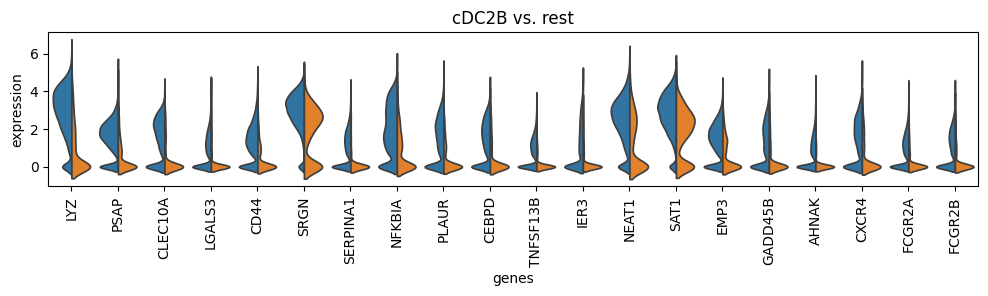

In [41]:
with plt.rc_context({"figure.figsize": (12, 2)}):
    sc.pl.rank_genes_groups_violin(data_DC2, n_genes=20, jitter=False, strip=False, save="DC2A_v_B_Degs_violins.svg")

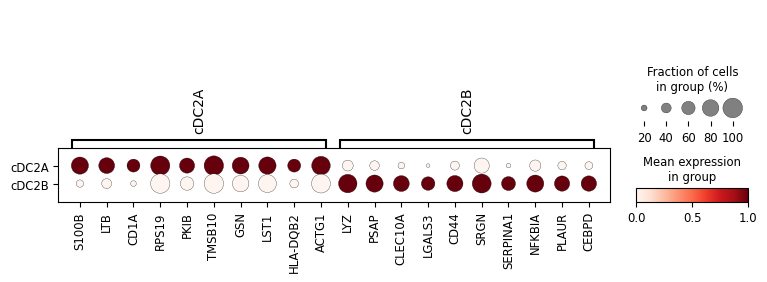

In [50]:
sc.pl.rank_genes_groups_dotplot(data_DC2, groupby="cDC2_A-B", key="degs_cDC2A_vs_cDC2B", standard_scale="var", n_genes=10)

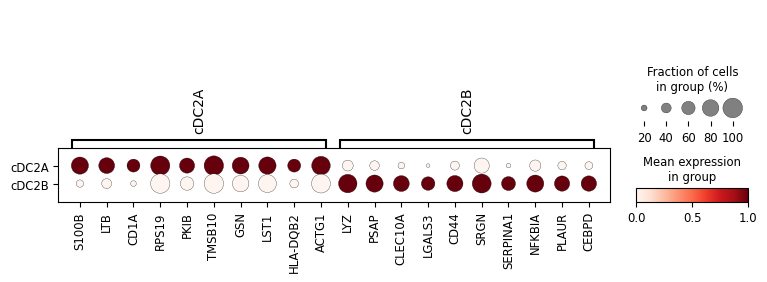

In [49]:
sc.pl.rank_genes_groups_dotplot(data_DC2, groupby="cDC2_A-B", standard_scale="var", n_genes=10, save="_DCA_v_B_DEGS_Dot.svg")

In [ ]:
# save DEGs

#DC2A up vs DC2B
DC2AUP_Degs = sc.get.rank_genes_groups_df(data_DC2, group="cDC2A", key="degs_cDC2A_vs_cDC2B")
#DC2B up vs DC2A
DC2BUP_Degs = sc.get.rank_genes_groups_df(data_DC2, group="cDC2B", key="degs_cDC2A_vs_cDC2B")

In [52]:
DC2AUP_Degs.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,S100B,43.027569,4.795932,0.000000e+00,0.000000e+00
1,LTB,33.491177,3.289601,6.478868e-246,2.278942e-242
2,CD1A,26.377388,3.160409,2.490480e-153,1.752053e-150
3,RPS19,24.381765,0.500934,2.670057e-131,1.138415e-128
4,PKIB,21.864599,1.465204,5.646013e-106,1.557635e-103


In [53]:
DC2BUP_Degs.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,LYZ,40.488724,3.481246,0.000000e+00,0.000000e+00
1,PSAP,34.915508,2.452944,4.324833e-267,2.028347e-263
2,CLEC10A,32.919300,2.846039,1.163813e-237,3.274971e-234
3,LGALS3,29.902472,3.103833,1.827505e-196,4.285500e-193
4,CD44,29.841267,2.204720,1.139592e-195,2.290581e-192


In [54]:
# change any p values that are 0.0 to 2.2250738585072014e-308
min_float = 1e-307
DC2AUP_Degs['pvals'] = DC2AUP_Degs['pvals'].replace(0.0, min_float)
DC2AUP_Degs['pvals_adj'] = DC2AUP_Degs['pvals_adj'].replace(0.0, min_float)

DC2BUP_Degs['pvals'] = DC2BUP_Degs['pvals'].replace(0.0, min_float)
DC2BUP_Degs['pvals_adj'] = DC2BUP_Degs['pvals_adj'].replace(0.0, min_float)

In [56]:
DC2BUP_Degs.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,LYZ,40.488724,3.481246,1.000000e-307,1.000000e-307
1,PSAP,34.915508,2.452944,4.324833e-267,2.028347e-263
2,CLEC10A,32.919300,2.846039,1.163813e-237,3.274971e-234
3,LGALS3,29.902472,3.103833,1.827505e-196,4.285500e-193
4,CD44,29.841267,2.204720,1.139592e-195,2.290581e-192


In [57]:
#export degs to csv
DC2BUP_Degs.to_csv("DEGs_DC2B_UP_v2.csv", index=False)
DC2AUP_Degs.to_csv("DEGs_DC2A_UP_v2.csv", index=False)

# Generating and exporting figures for paper: 

In [52]:
data_DC2 = sc.read_h5ad('20250629_DC2_bbknn_clustered2.h5ad') 

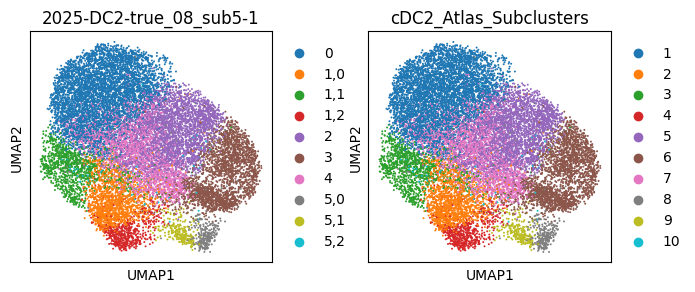

In [38]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["2025-DC2-true_08_sub5-1","cDC2_Atlas_Subclusters"], ncols = 2, size=8)

In [ ]:
#set current directory 
#os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects/DC2_Subclusters_Fig')
#os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects/DC2_Subclusters_Fig'

In [16]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

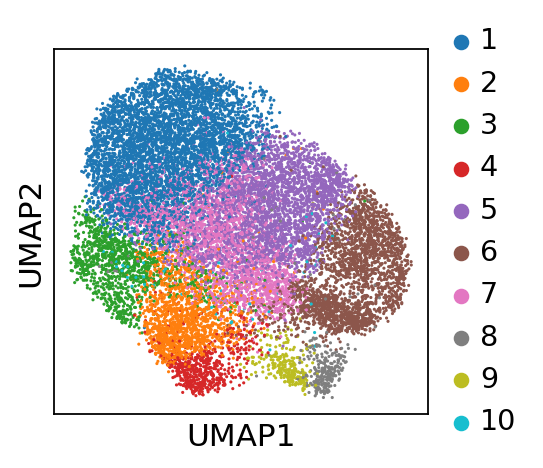

In [12]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["cDC2_Atlas_Subclusters"], ncols = 1, size=8, title="", save="_cDC2_10_Subclusters.svg")

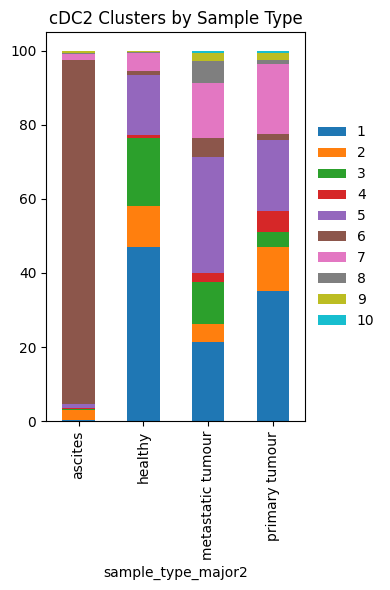

In [7]:
pd.crosstab(data_DC2.obs["sample_type_major2"], data_DC2.obs["cDC2_Atlas_Subclusters"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(4,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("cDC2 Clusters by Sample Type")
plt.tight_layout()  
plt.savefig("barplot_DC2_clusters-tissues2.svg", format="svg", bbox_inches="tight")
plt.show()

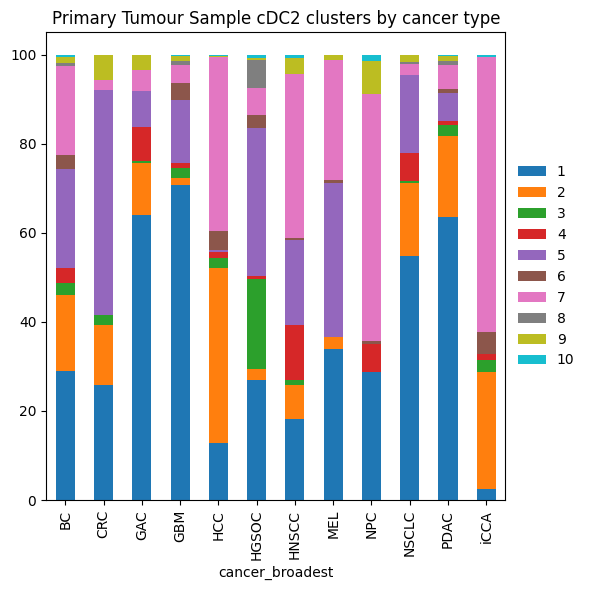

In [8]:
# subset to just primary
data_DC2_P = data_DC2[data_DC2.obs["sample_type_major2"] == "primary tumour"]

pd.crosstab(data_DC2_P.obs["cancer_broadest"], data_DC2_P.obs["cDC2_Atlas_Subclusters"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.title("Primary Tumour Sample cDC2 clusters by cancer type")
plt.tight_layout()  
plt.savefig("barplot_DC2_clusters-cancers2.svg", format="svg", bbox_inches="tight")
plt.show()

## Investigating ascites cluster (cDC2_Atlas_Subclusters cluster 6)

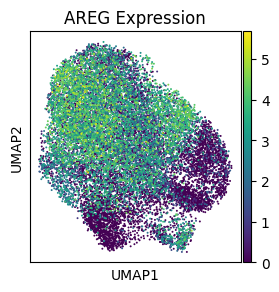

In [10]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["AREG"], ncols=1, size=8, title="AREG Expression")

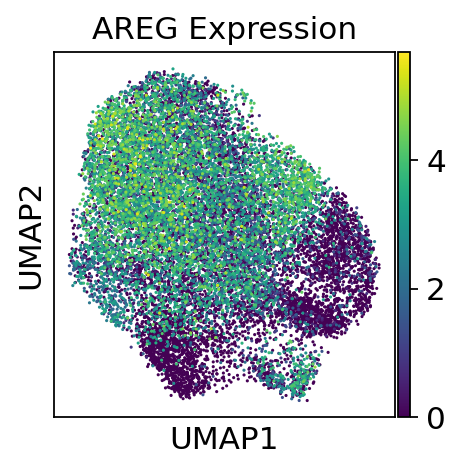

In [ ]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=["AREG"], ncols=1, size=8, title="AREG Expression", save="_cDC2_AREG.svg")

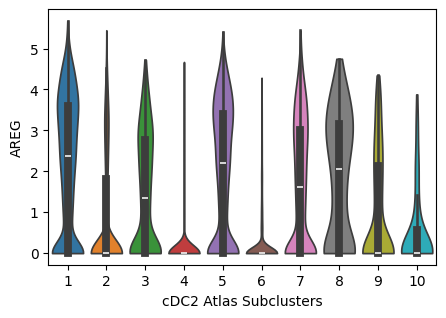

In [14]:
with plt.rc_context({"figure.figsize": (5, 3.5)}):
    sc.pl.violin(
        data_DC2,
        keys="AREG",  
        groupby='cDC2_Atlas_Subclusters',
        stripplot=False,
        inner='box',
        #save="_DC2_clusters_AREG.svg"
    )

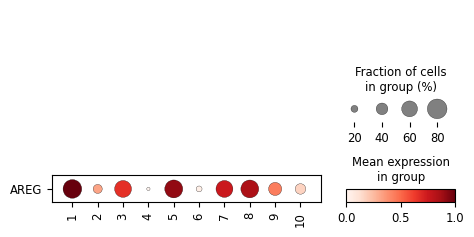

In [26]:
sc.pl.dotplot(data_DC2, "AREG", groupby="cDC2_Atlas_Subclusters", standard_scale="var", swap_axes=True, save="_cDC2_AREG_dots2.svg")

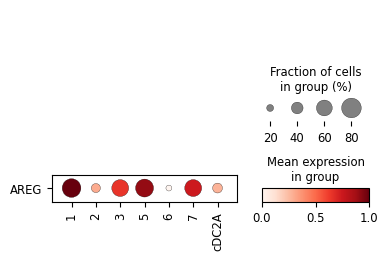

In [27]:
# Re-number clusters to label cDC2A and not B
data_DC2.obs["cDC2B_Breakdown"] = data_DC2.obs["2025-DC2-true_08_sub5-1"].map(
    {
        "0": "1",
        "1,0": "2",
        "1,1": "3",
        "1,2": "cDC2A",
        "2": "5",
        "3": "6",
        "4": "7",
        "5,0": "cDC2A",
        "5,1": "cDC2A",
        "5,2": "cDC2A",
    }
)

sc.pl.dotplot(data_DC2, "AREG", groupby="cDC2B_Breakdown", standard_scale="var", swap_axes=True, save="_cDC2_AREG_dots_A.svg")

## calculating DEG genes between cluster 6 and all other cDC2B clusters

In [44]:
# subset to cDC2B
data_DC2B = data_DC2[data_DC2.obs["cDC2_A-B"] == "cDC2B"]

In [45]:
# check annots
print(data_DC2B.obs['cDC2_Atlas_Subclusters'].value_counts())

cDC2_Atlas_Subclusters
1    4914
5    3078
6    2400
7    2345
2    1538
3    1123
Name: count, dtype: int64


In [46]:
#calculate DEG genes between cluster 6 and all others:
sc.tl.rank_genes_groups(data_DC2B, groupby="cDC2_Atlas_Subclusters", groups=["6"], reference="rest", method="wilcoxon")

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


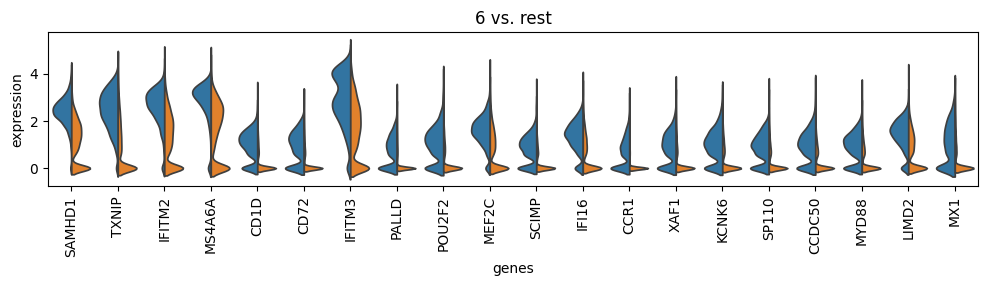

In [48]:
with plt.rc_context({"figure.figsize": (12, 2)}):
    sc.pl.rank_genes_groups_violin(data_DC2B, groups=["6"], n_genes=20, jitter=False, strip=False, save="DC2B_Degs_violin2.svg")

In [49]:
# save DEGs
DC2_Degs = sc.get.rank_genes_groups_df(data_DC2B, group="6")
DC2_Degs.to_csv("DC2_Degs_6.csv", index=False)

In [50]:
DC2_Degs.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,SAMHD1,60.629177,2.248811,0.0,0.0
1,TXNIP,58.755280,3.019002,0.0,0.0
2,IFITM2,53.074936,2.226368,0.0,0.0
3,MS4A6A,49.342384,1.918665,0.0,0.0
4,CD1D,47.361607,2.395579,0.0,0.0


In [51]:
# calculate top 10 up and down regulated DEGs

# Filter upregulated genes
up = DC2_Degs[(DC2_Degs['logfoldchanges'] > 0.58) & (DC2_Degs['pvals_adj'] < 0.05)]
top_up = up.sort_values('scores', ascending=False).head(20)

# Filter downregulated genes
down = DC2_Degs[(DC2_Degs['logfoldchanges'] < -0.58) & (DC2_Degs['pvals_adj'] < 0.05)]
top_down = down.sort_values('scores', ascending=False).head(20)

In [52]:
top_up_names = top_up['names'].tolist()

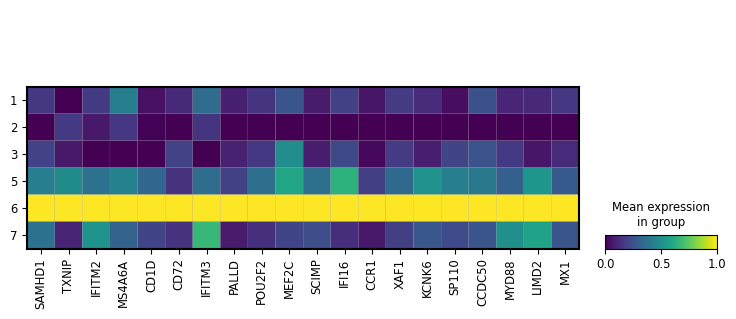

In [53]:
# plot DEGs
with plt.rc_context({"figure.figsize": (16, 3)}):
    sc.pl.matrixplot(data_DC2B, top_up_names, groupby="cDC2_Atlas_Subclusters", standard_scale="var")

## Overlaying signatures from Moon et al 2025:

In [17]:
# overlay Moon et al 2025 sigs
DC_CD207 = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 
DC_ISG = ['ISG15', 'ISG20', 'CXCL9', 'CXCL10', 'IFIT1', 'IFIT3', 'IFI6', 'GBP2']

In [18]:
# Define dictionary of gene sets
gene_sets = {
    "DC_CD207_sig": DC_CD207,
    "DC_ISG_sig": DC_ISG,
}

In [19]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

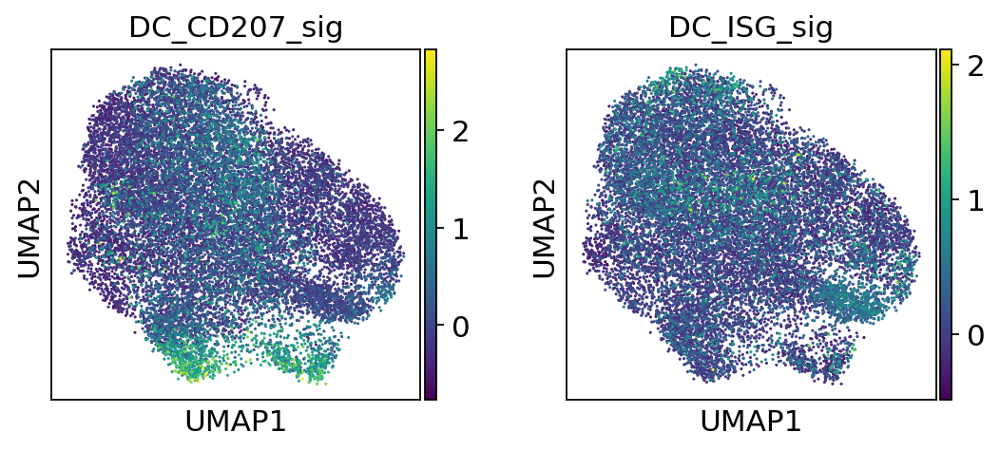

In [20]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=gene_sets, ncols=3, size=8, save="_cDC2_Moon_Sigs.svg")

# Re-making signature heatmap with updated cDC2 subclusters

In [4]:
#define DC subset gene sets from Guimaraes et al and Cheng et al
DC2_FCER1A = ['CD1C', 'FCER1A', 'CLEC10A']
DC2_AREG = ['AREG']
# removed DC2_CD207 = ['CD207','CD1A'] as within Cheng et al DC2_CD1A
DC3_CD14 = ['CD14', 'S100A9', 'S100A8', 'VCAN', 'LYZ','ANXA1']
DC4_FCGR3A = ['FCGR3A', 'FTL', 'SERPINA1']
DC_CXCL8 = ['CXCL2'] #CXCL8 removed as not in atlas 

DC2_CXCR4 = ['CXCR4','DUSP4','FCER1A']
DC2_CD1A = ['CD207','CD1A','S100B','LTB'] # also Guimaraes DC2_CD207
DC2_IL1B = ['IL1B','TNF','CCL3','CCL4']
DC2_FCN1 = ['CD163', 'CD14', 'FCN1','S100A9','S100A8']
DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
DC2_CXCL9 = ['CXCL9','CXCL10','IDO1']

In [10]:
gene_sets_all = {
    "Guimaraes_DC2_FCER1A": DC2_FCER1A,
    "Guimaraes_DC2_AREG": DC2_AREG,
    "Guimaraes_DC3_CD14": DC3_CD14,
    "Guimaraes_DC4_FCGR3A": DC4_FCGR3A,
    "Guimaraes_DC_CXCL2": DC_CXCL8,
    "Cheng_DC2_CXCR4": DC2_CXCR4,
    "Cheng_Guimaraes_DC2_CD1A/CD207": DC2_CD1A,
    "Cheng_DC2_IL1B": DC2_IL1B,
    "Cheng_DC2_FCN1": DC2_FCN1,
    "Cheng_DC2_ISG15": DC2_ISG15,
    "Cheng_DC2_CXCL9": DC2_CXCL9
}

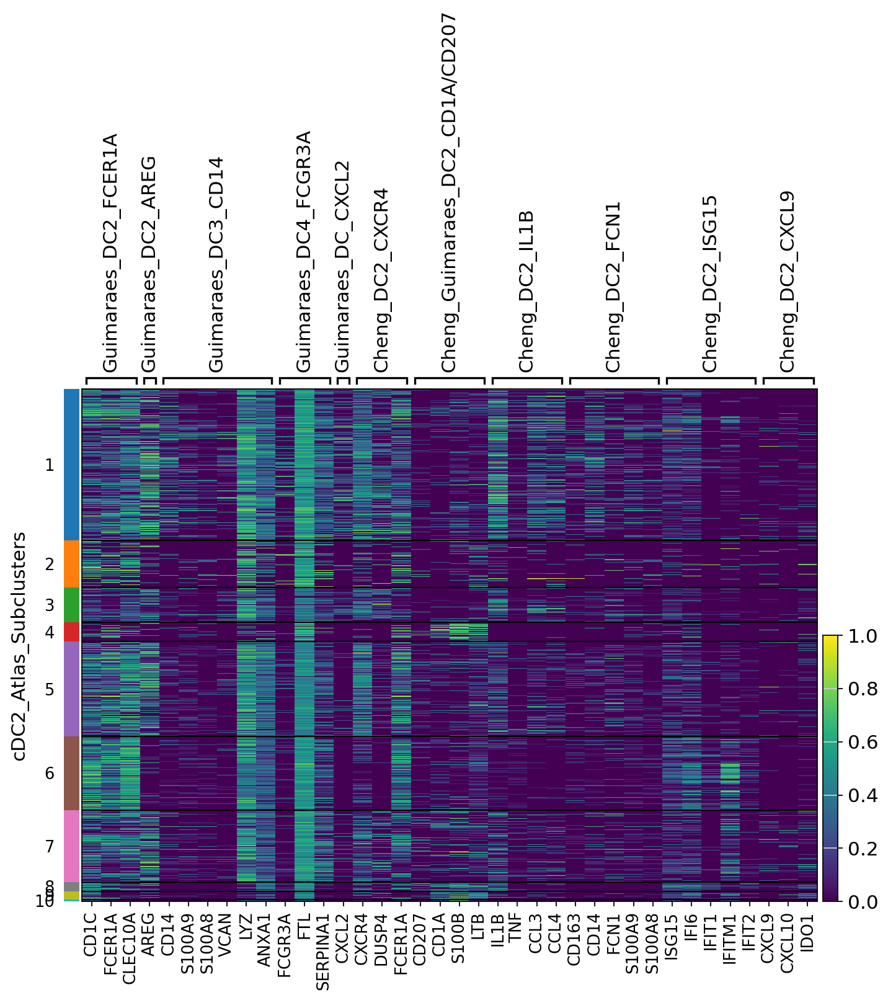

In [17]:
sc.pl.heatmap(data_DC2, gene_sets_all, groupby="cDC2_Atlas_Subclusters", standard_scale="var", figsize=(10,7), save="_DC2_subcluster_sigs_updated3.svg") 

# Comparing cDC2A/ CD207/ CD1A signatures 

In [5]:
# CD207+ / cDC2A sigs
DC_CD207_Moon = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 
cDC2A_Minutti = ['CLEC4A','LTB','IL22RA2','CD3E']
DC2_CD207_Gui = ['CD207','CD1A'] 
DC2_CD1A_Cheng = ['CD207','CD1A','S100B','LTB'] 

In [6]:
# Define dictionary of gene sets
gene_sets = {
    "DC_CD207_Moon_sig": DC_CD207_Moon,
    "cDC2A_Minutti_sig": cDC2A_Minutti,
    "DC2_CD207_Gui_sig": DC2_CD207_Gui,
    "DC2_CD1A_Cheng_sig": DC2_CD1A_Cheng
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [8]:
colour_vars = ["DC_CD207_Moon_sig","cDC2A_Minutti_sig","DC2_CD207_Gui_sig","DC2_CD1A_Cheng_sig"]

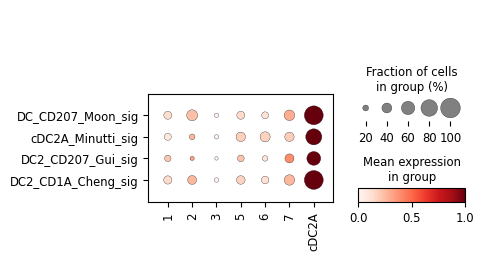

In [32]:
sc.pl.dotplot(data_DC2, colour_vars, groupby="cDC2B_Breakdown", standard_scale="var", swap_axes=True)

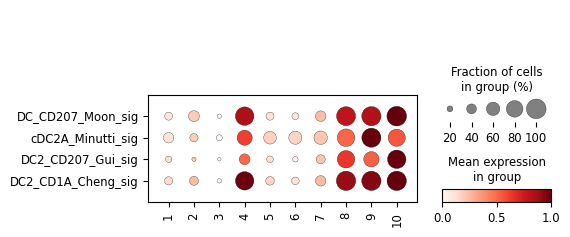

In [ ]:
sc.pl.dotplot(data_DC2, colour_vars, groupby="cDC2B_Breakdown", standard_scale="var", swap_axes=True)

# Making Violin plots for each DC2 gene signature:

In [5]:
#define DC subset gene sets from Guimaraes et al and Cheng et al
DC2_FCER1A = ['CD1C', 'FCER1A', 'CLEC10A']
DC2_AREG = ['AREG']
DC2_CD207 = ['CD207','CD1A'] #similar to DC2_CD1A in Cheng et al
DC3_CD14 = ['CD14', 'S100A9', 'S100A8', 'VCAN', 'LYZ','ANXA1']
DC4_FCGR3A = ['FCGR3A', 'FTL', 'SERPINA1']
DC_CXCL8 = ['CXCL2'] #CXCL8 removed as not in atlas 

DC2_CXCR4 = ['CXCR4','DUSP4','FCER1A']
DC2_CD1A = ['CD207','CD1A','S100B','LTB'] 
DC2_IL1B = ['IL1B','TNF','CCL3','CCL4']
DC2_FCN1 = ['CD163', 'CD14', 'FCN1','S100A9','S100A8']
DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
DC2_CXCL9 = ['CXCL9','CXCL10','IDO1']

In [6]:
gene_sets_all = {
    "Guimaraes_DC2_FCER1A": DC2_FCER1A,
    "Guimaraes_DC2_AREG": DC2_AREG,
    "Guimaraes_DC2_CD207": DC2_CD207,
    "Guimaraes_DC3_CD14": DC3_CD14,
    "Guimaraes_DC4_FCGR3A": DC4_FCGR3A,
    "Guimaraes_DC_CXCL2": DC_CXCL8,
    "Cheng_DC2_CXCR4": DC2_CXCR4,
    "Cheng_DC2_CD1A": DC2_CD1A,
    "Cheng_DC2_IL1B": DC2_IL1B,
    "Cheng_DC2_FCN1": DC2_FCN1,
    "Cheng_DC2_ISG15": DC2_ISG15,
    "Cheng_DC2_CXCL9": DC2_CXCL9
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets_all.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

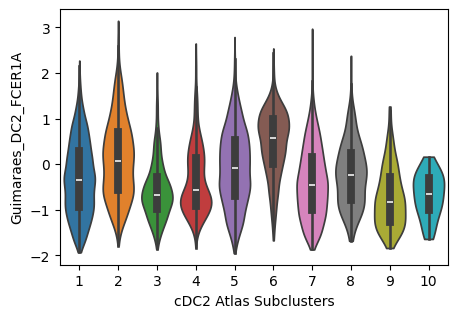

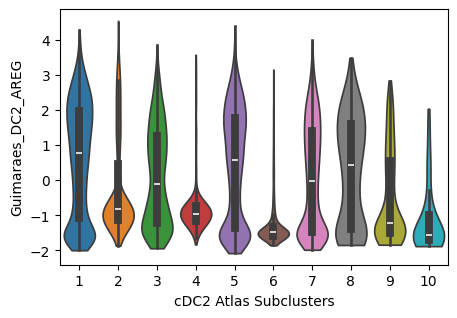

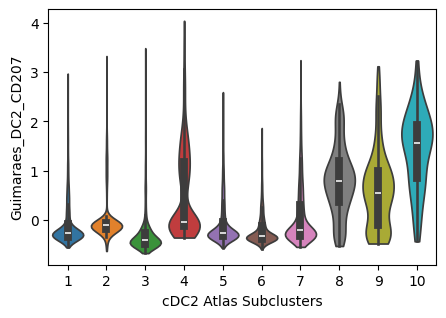

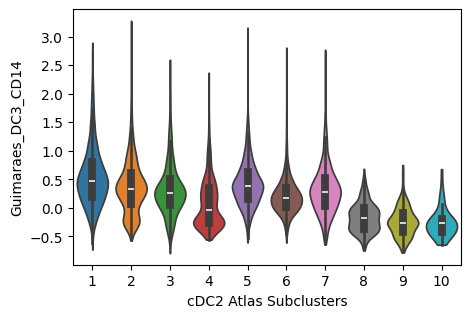

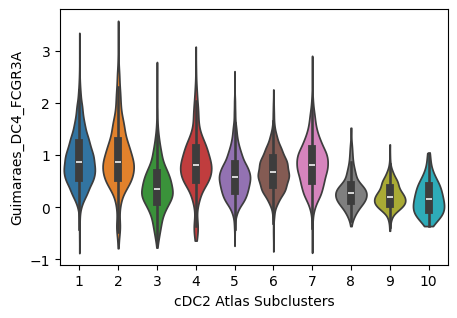

...

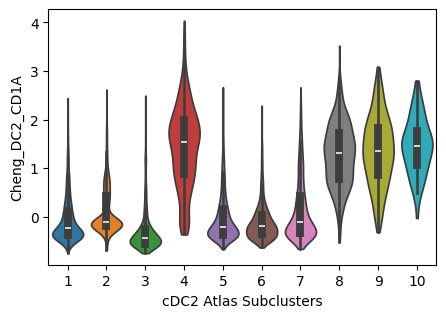

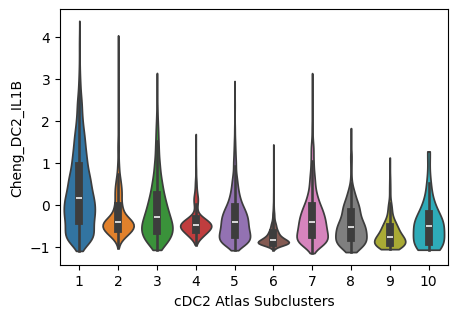

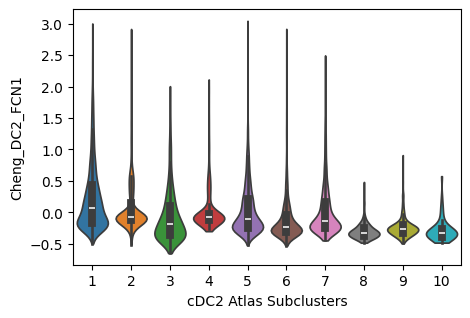

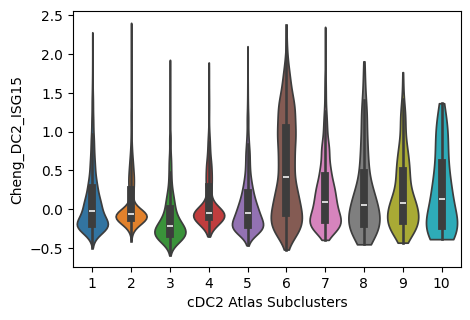

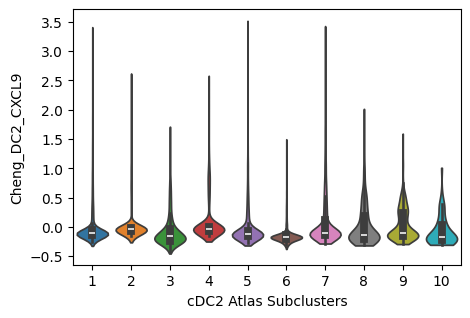

In [9]:
with plt.rc_context({"figure.figsize": (5, 3.5)}):
    for gene in gene_sets_all.keys():
        sc.pl.violin(
            data_DC2,
            keys=gene,
            groupby='cDC2_Atlas_Subclusters',
            stripplot=False,
            inner='box',
            show=True,  
            save=f"_DC2_sigoverlay_Violin_{gene}.svg"
        )

In [12]:
#define DC subset gene sets from Villani et al 2017
DC3_sig = ['S100A9','S100A8','VCAN','LYZ','ANXA1','PLBD1','RNASE2','FCER1A','SLC2A3','CD163','CSF3R','MNDA','CD14','NAIP','CSTA','FCN1','CD1D','FPR1','F13A1','CLEC10A','CES1','PID1','S100A12','MTMR11','SMA','LAT2','RETN','TMEM173','AOAH','RAB3D','CD36','MGST1','TREM1','HNMT','CES1P1','ADAM15','IL13RA1','MICAL2','ITGA5','CREB5','IL1B','NR4A2','MPP7','PTAFR','HBEGF','NFE2','ASGR1','BST1','IL1RN','NOD2','NLRP3','DQ575504','LMNA','C9ORF89','IL27RA','NLRP12','RAB27A','EREG','LOC284454']
DC_CD207_Moon = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 

In [13]:
# Define dictionary of gene sets
gene_sets = {
    "DC3_sig": DC3_sig,
    "DC_CD207_Moon_sig": DC_CD207_Moon
}

In [14]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

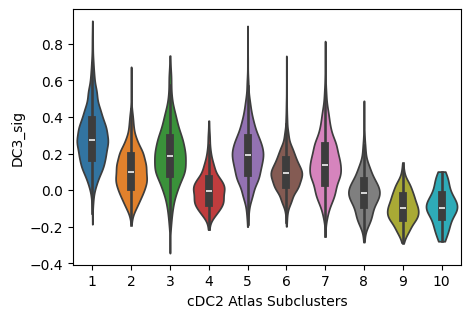

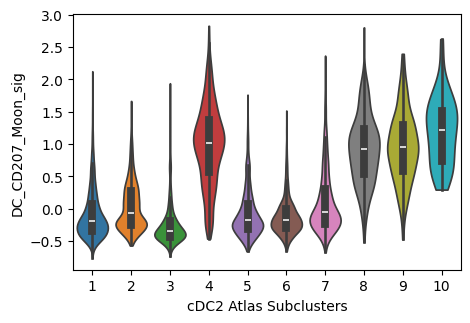

In [15]:
with plt.rc_context({"figure.figsize": (5, 3.5)}):
    for gene in gene_sets.keys():
        sc.pl.violin(
            data_DC2,
            keys=gene,
            groupby='cDC2_Atlas_Subclusters',
            stripplot=False,
            inner='box',
            show=True,  
            save=f"_DC2_sigoverlay_Violin_{gene}.svg"
        )

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

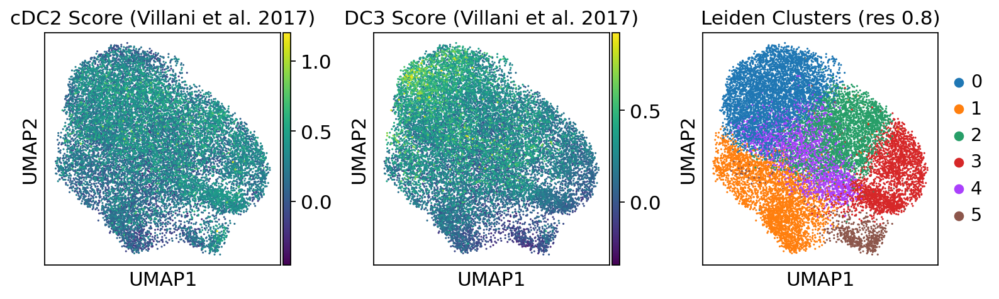

In [ ]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=colour_vars, ncols=3, size=8, title=titles, save="_DC2_sigs_Villani_overlay.svg")

# Comparing ISG Sigs:

In [5]:
Cheng_DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
Moon_DC_ISG = ['ISG15', 'ISG20', 'CXCL9', 'CXCL10', 'IFIT1', 'IFIT3', 'IFI6', 'GBP2']

In [6]:
# Define dictionary of gene sets
gene_sets = {
    "Cheng_DC2_ISG15_sig": Cheng_DC2_ISG15,
    "Moon_DC_ISG_sig": Moon_DC_ISG,
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

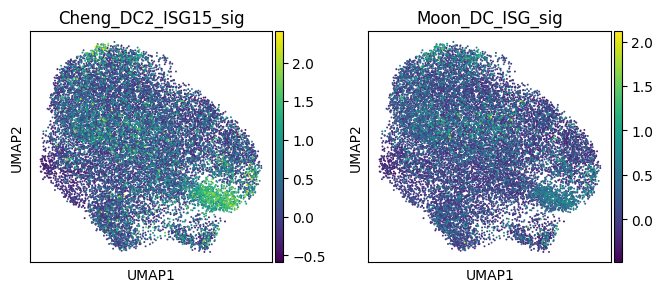

In [8]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_DC2, color=gene_sets, ncols=2, size=8)

# Calculating DEG genes between all 10 cDC2 subclusters: 

In [15]:
#calculate DEG genes between all cDC2 clusters
sc.tl.rank_genes_groups(data_DC2, groupby="cDC2_Atlas_Subclusters", method="wilcoxon", key_added="degs_cDC2_subclusters")

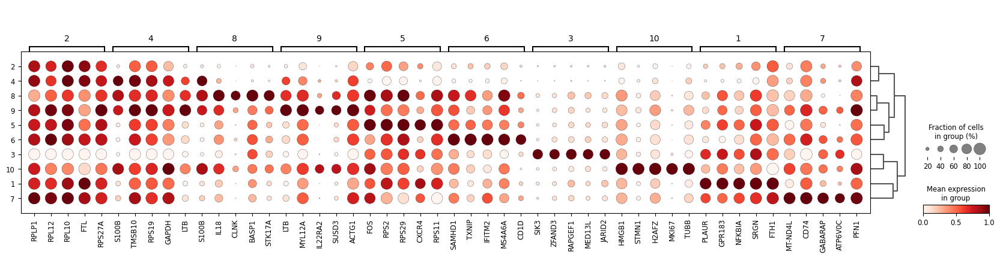

In [18]:
sc.pl.rank_genes_groups_dotplot(
    data_DC2, groupby="cDC2_Atlas_Subclusters", standard_scale="var", n_genes=5, key="degs_cDC2_subclusters"
)

In [41]:
# read out for each cluster
DC2_c1 = sc.get.rank_genes_groups_df(data_DC2, group="1", key="degs_cDC2_subclusters")
DC2_c2 = sc.get.rank_genes_groups_df(data_DC2, group="2", key="degs_cDC2_subclusters")
DC2_c3 = sc.get.rank_genes_groups_df(data_DC2, group="3", key="degs_cDC2_subclusters")
DC2_c4 = sc.get.rank_genes_groups_df(data_DC2, group="4", key="degs_cDC2_subclusters")
DC2_c5 = sc.get.rank_genes_groups_df(data_DC2, group="5", key="degs_cDC2_subclusters")
DC2_c6 = sc.get.rank_genes_groups_df(data_DC2, group="6", key="degs_cDC2_subclusters")
DC2_c7 = sc.get.rank_genes_groups_df(data_DC2, group="7", key="degs_cDC2_subclusters")
DC2_c8 = sc.get.rank_genes_groups_df(data_DC2, group="8", key="degs_cDC2_subclusters")
DC2_c9 = sc.get.rank_genes_groups_df(data_DC2, group="9", key="degs_cDC2_subclusters")
DC2_c10 = sc.get.rank_genes_groups_df(data_DC2, group="10", key="degs_cDC2_subclusters")

In [42]:
#set current directory 
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects/DC2_Subcluster_DEGS')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects/DC2_Subcluster_DEGS'

In [43]:
DC2_c1.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,PLAUR,65.878342,2.421053,0.0,0.0
1,GPR183,64.141838,2.355797,0.0,0.0
2,NFKBIA,60.662914,2.310473,0.0,0.0
3,SRGN,59.542950,1.457629,0.0,0.0
4,FTH1,59.011681,1.123554,0.0,0.0


In [44]:
# check what the smallest p value python can output is (set any equal to zero to this)
import numpy as np
np.finfo(np.float64).tiny

#would set floor to this, however excel (which will use for subsequent analysis has a floor of 1e-307, so instead set minimum to this)

2.2250738585072014e-308

In [45]:
# change any p values that are 0.0 to 2.2250738585072014e-308
min_float = 1e-307
DC2_c1['pvals'] = DC2_c1['pvals'].replace(0.0, min_float)
DC2_c1['pvals_adj'] = DC2_c1['pvals_adj'].replace(0.0, min_float)
DC2_c2['pvals'] = DC2_c2['pvals'].replace(0.0, min_float)
DC2_c2['pvals_adj'] = DC2_c2['pvals_adj'].replace(0.0, min_float)
DC2_c3['pvals'] = DC2_c3['pvals'].replace(0.0, min_float)
DC2_c3['pvals_adj'] = DC2_c3['pvals_adj'].replace(0.0, min_float)
DC2_c4['pvals'] = DC2_c4['pvals'].replace(0.0, min_float)
DC2_c4['pvals_adj'] = DC2_c4['pvals_adj'].replace(0.0, min_float)
DC2_c5['pvals'] = DC2_c5['pvals'].replace(0.0, min_float)
DC2_c5['pvals_adj'] = DC2_c5['pvals_adj'].replace(0.0, min_float)
DC2_c6['pvals'] = DC2_c6['pvals'].replace(0.0, min_float)
DC2_c6['pvals_adj'] = DC2_c6['pvals_adj'].replace(0.0, min_float)
DC2_c7['pvals'] = DC2_c7['pvals'].replace(0.0, min_float)
DC2_c7['pvals_adj'] = DC2_c7['pvals_adj'].replace(0.0, min_float)
DC2_c8['pvals'] = DC2_c8['pvals'].replace(0.0, min_float)
DC2_c8['pvals_adj'] = DC2_c8['pvals_adj'].replace(0.0, min_float)
DC2_c9['pvals'] = DC2_c9['pvals'].replace(0.0, min_float)
DC2_c9['pvals_adj'] = DC2_c9['pvals_adj'].replace(0.0, min_float)
DC2_c10['pvals'] = DC2_c10['pvals'].replace(0.0, min_float)
DC2_c10['pvals_adj'] = DC2_c10['pvals_adj'].replace(0.0, min_float)

In [46]:
DC2_c1.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,PLAUR,65.878342,2.421053,1.000000e-307,1.000000e-307
1,GPR183,64.141838,2.355797,1.000000e-307,1.000000e-307
2,NFKBIA,60.662914,2.310473,1.000000e-307,1.000000e-307
3,SRGN,59.542950,1.457629,1.000000e-307,1.000000e-307
4,FTH1,59.011681,1.123554,1.000000e-307,1.000000e-307


In [48]:
# save degs
DC2_c1.to_csv("DEGs_DC2_c1.csv", index=False)
DC2_c2.to_csv("DEGs_DC2_c2.csv", index=False)
DC2_c3.to_csv("DEGs_DC2_c3.csv", index=False)
DC2_c4.to_csv("DEGs_DC2_c4.csv", index=False)
DC2_c5.to_csv("DEGs_DC2_c5.csv", index=False)
DC2_c6.to_csv("DEGs_DC2_c6.csv", index=False)
DC2_c7.to_csv("DEGs_DC2_c7.csv", index=False)
DC2_c8.to_csv("DEGs_DC2_c8.csv", index=False)
DC2_c9.to_csv("DEGs_DC2_c9.csv", index=False)
DC2_c10.to_csv("DEGs_DC2_c10.csv", index=False)

# Make dot plot of all DC2 signatures:

In [5]:
#define DC subset gene sets from Guimaraes et al and Cheng et al
DC2_FCER1A_Guimaraes = ['CD1C', 'FCER1A', 'CLEC10A']
DC2_AREG_Guimaraes = ['AREG']
DC2_CD207_Guimaraes = ['CD207','CD1A'] 
DC3_CD14_Guimaraes = ['CD14', 'S100A9', 'S100A8', 'VCAN', 'LYZ','ANXA1']
DC4_FCGR3A_Guimaraes = ['FCGR3A', 'FTL', 'SERPINA1']
DC_CXCL8_Guimaraes = ['CXCL2'] #CXCL8 removed as not in atlas 

DC2_CXCR4_Cheng = ['CXCR4','DUSP4','FCER1A']
DC2_CD1A_Cheng = ['CD207','CD1A','S100B','LTB'] 
DC2_IL1B_Cheng = ['IL1B','TNF','CCL3','CCL4']
DC2_FCN1_Cheng = ['CD163', 'CD14', 'FCN1','S100A9','S100A8']
DC2_ISG15_Cheng = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
DC2_CXCL9_Cheng = ['CXCL9','CXCL10','IDO1']

#define DC subset gene sets from Villani et al 2017
cDC2A_Minutti = ['CLEC4A','LTB','IL22RA2','CD3E']
cDC2B_Minutti = ['CEBPD','IL1R2','FCER1A','FCN1','IL1B','CD1C','CEBPB','CLEC10A']

# CD207+ / cDC2A sigs
DC_CD207_Moon = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 


In [14]:
gene_sets_all = {
    "DC2_CXCR4_Cheng": DC2_CXCR4_Cheng,
    "DC2_FCER1A_Guimaraes": DC2_FCER1A_Guimaraes,
    "DC2_AREG_Guimaraes": DC2_AREG_Guimaraes,
    "DC2_CXCL9_Cheng": DC2_CXCL9_Cheng,
    "DC2_IL1B_Cheng": DC2_IL1B_Cheng,
    "DC2_FCN1_Cheng": DC2_FCN1_Cheng,
    "DC3_CD14_Guimaraes": DC3_CD14_Guimaraes,
    "DC4_FCGR3A_Guimaraes": DC4_FCGR3A_Guimaraes,
    "DC_CXCL8_Guimaraes": DC_CXCL8_Guimaraes,
    "DC2_ISG15_Cheng": DC2_ISG15_Cheng,
    "cDC2B_Minutti": cDC2B_Minutti,
    "DC2_CD1A_Cheng": DC2_CD1A_Cheng,
    "DC2_CD207_Guimaraes": DC2_CD207_Guimaraes,
    "cDC2A_Minutti": cDC2A_Minutti,
    "DC_CD207_Moon": DC_CD207_Moon,
}

In [15]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets_all.items():
    sc.tl.score_genes(data_DC2, genes, score_name=name)

In [16]:
colour_vars = ["DC2_CXCR4_Cheng","DC2_FCER1A_Guimaraes","DC2_AREG_Guimaraes","DC2_CXCL9_Cheng","DC2_IL1B_Cheng","DC2_FCN1_Cheng","DC3_CD14_Guimaraes","DC4_FCGR3A_Guimaraes"
    ,"DC_CXCL8_Guimaraes","DC2_ISG15_Cheng","cDC2B_Minutti","DC2_CD1A_Cheng","DC2_CD207_Guimaraes","cDC2A_Minutti","DC_CD207_Moon"]

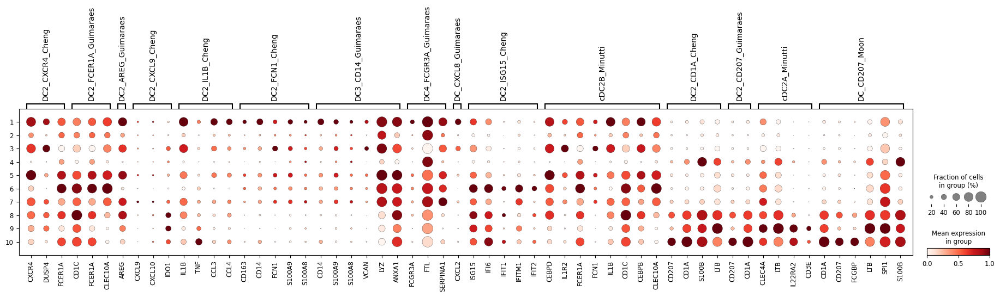

In [17]:
sc.pl.dotplot(data_DC2, gene_sets_all, groupby="cDC2_Atlas_Subclusters", standard_scale="var")

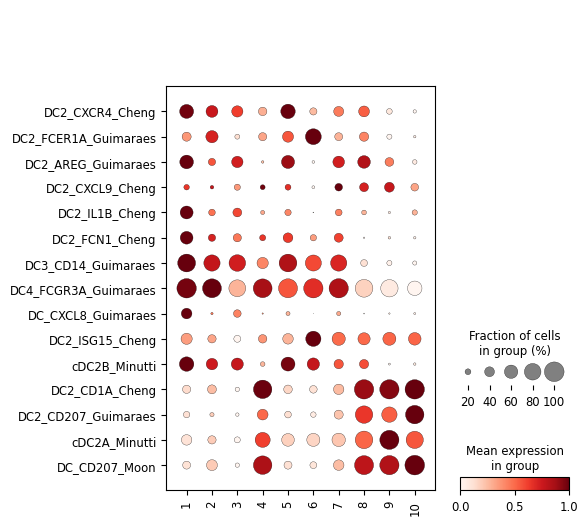

In [18]:
sc.pl.dotplot(data_DC2, colour_vars, groupby="cDC2_Atlas_Subclusters", standard_scale="var", swap_axes=True)

# Testing genes for overlaying on Brown/Minutti

In [4]:
# define deg lists (only kept genes present in all 3 datasets)
NR_cDC2A_Sig = ['S100B','LTB','CD1A','PKIB','GSN','LST1','HLA-DQB2','ACTG1','AIF1','IL22RA2','ACTB','NDRG2','SUSD3','IL18','TACSTD2','GDI2','CLNK','SMCO4','HPGDS','GPR82','TUBA1B',
                    'PSMB9','C15orf48','CA2','GNGT2','GNAO1','PPM1N','SMAGP','PIK3R6','PLAC8','KCNMB1','FUT8','ABI3','PDGFRB','FCGBP','PTMS','CEACAM3','PAK1','PPM1J','CD207','PARM1',
                    'CBR3','CYFIP2','BCO2','MYL9','TUBB','SIGLEC10','CCND1','ANKRD55','GAS2L3','CD1E','SH3YL1','LPAR3','SMPDL3B','CCR6','IDO1','RAB33A','RUNX3','STK17A','NOTCH4','NAALADL1',
                    'NME4','CDK2AP2','DCTPP1','ACY3','SCPEP1','GTF2IRD1','TLR10','KALRN','SFTPD','NKG7','LBH','ACOX1','MTRNR2L12','CDH17','KCNK17','ITGB7','HIP1','NRN1','MTRNR2L8','CYSLTR1',
                    'RGS19','ARHGEF35','DAPK2','PSTPIP2','OCIAD2','SNAP29','PREX2','C12orf75','SYT2','FFAR4','CD3E','CCNG2','LSR','MACC1','PRKAR2B','NBEAL2','GAB3','PAWR','MYO1D']

In [5]:
# Convert to set for fast intersection
genes_set = set(NR_cDC2A_Sig)

# In main data
genes_in_main = genes_set.intersection(set(data_DC2.var_names))
print(f"{len(genes_in_main)} of {len(NR_cDC2A_Sig)} genes are in data_DC2.var_names")

# In .raw (if it exists)
if data_DC2.raw is not None:
    genes_in_raw = genes_set.intersection(set(data_DC2.raw.var_names))
    print(f"{len(genes_in_raw)} of {len(NR_cDC2A_Sig)} genes are in data_DC2.raw.var_names")
else:
    print("No raw attribute found in data_DC2.")

57 of 100 genes are in data_DC2.var_names
100 of 100 genes are in data_DC2.raw.var_names
